In [25]:
import pandas as pd

# Load filtered metadata
metadata_file_path = 'statista_dataset/dataset_copy/filtered_metadata.csv'
metadata = pd.read_csv(metadata_file_path)

# Inspect the data
print(f"Total charts: {len(metadata)}")
print(metadata.head())


Total charts: 27868
                                    imgPath  \
0  statista_dataset/dataset_copy/imgs/1.png   
1  statista_dataset/dataset_copy/imgs/2.png   
2  statista_dataset/dataset_copy/imgs/3.png   
3  statista_dataset/dataset_copy/imgs/4.png   
4  statista_dataset/dataset_copy/imgs/5.png   

                                             caption chartType       xAxis  \
0  How many users does Facebook have? With over 2...      line  Unnamed: 0   
1   This statistic presents the estimated net wor...       bar  Unnamed: 0   
2   This statistic shows the reported violent cri...      line  Unnamed: 0   
3   Emmitt Smith is the all-time rushing leader o...       bar  Unnamed: 0   
4   As of July 2020, Cristiano Ronaldo leads the ...       bar  Unnamed: 0   

                                               yAxis  
0                        Number of users in millions  
1                  Net worth in billion U.S. dollars  
2  Reported violent crime rate per 100,000 popula...  
3       

In [29]:
import pandas as pd



# Inspect the dataset
print(f"Total entries: {len(metadata)}")
print(metadata['chartType'].value_counts())


Total entries: 27868
chartType
column    16319
bar        8272
line       2646
pie         408
table       223
Name: count, dtype: int64


In [34]:
# Minimum count per chart type
min_count = metadata['chartType'].value_counts().min()
print(f"Minimum samples per chart type: {min_count}")

# Equal sampling for each chart type using a simpler approach
equal_sampled_metadata = pd.concat([
    group.sample(n=min_count, random_state=42) 
    for name, group in metadata.groupby('chartType')
])

# Reset the index
equal_sampled_metadata = equal_sampled_metadata.reset_index(drop=True)

# Verify the new distribution
print("\nEqual sampling of chart types:")
print(equal_sampled_metadata['chartType'].value_counts())

Minimum samples per chart type: 223

Equal sampling of chart types:
chartType
bar       223
column    223
line      223
pie       223
table     223
Name: count, dtype: int64


In [35]:
from sklearn.model_selection import train_test_split

# Perform stratified split
train_metadata, test_metadata = train_test_split(
    equal_sampled_metadata,
    test_size=0.2,  # 20% for testing
    stratify=equal_sampled_metadata['chartType'],  # Ensure equal representation
    random_state=42  # For reproducibility
)

# Verify the splits
print("\nTrain set chart type distribution:")
print(train_metadata['chartType'].value_counts())

print("\nTest set chart type distribution:")
print(test_metadata['chartType'].value_counts())



Train set chart type distribution:
chartType
column    179
table     179
line      178
pie       178
bar       178
Name: count, dtype: int64

Test set chart type distribution:
chartType
bar       45
pie       45
line      45
table     44
column    44
Name: count, dtype: int64


In [36]:
# Save train metadata
train_metadata.to_csv('statista_dataset/dataset_copy/train_metadata.csv', index=False)
print("Train metadata saved to 'statista_dataset/dataset_copy/train_metadata.csv'.")

# Save test metadata
test_metadata.to_csv('statista_dataset/dataset_copy/test_metadata.csv', index=False)
print("Test metadata saved to 'statista_dataset/dataset_copy/test_metadata.csv'.")


Train metadata saved to 'statista_dataset/dataset_copy/train_metadata.csv'.
Test metadata saved to 'statista_dataset/dataset_copy/test_metadata.csv'.


In [4]:
import pandas as pd

# Load and inspect train metadata
train_metadata = pd.read_csv('statista_dataset/dataset_copy/train_metadata.csv')
print(f"Train metadata: {len(train_metadata)} entries")
print(train_metadata.head())

# Load and inspect test metadata
test_metadata = pd.read_csv('statista_dataset/dataset_copy/test_metadata.csv')
print(f"Test metadata: {len(test_metadata)} entries")
print(test_metadata.head())


Train metadata: 892 entries
                                        imgPath  \
0  statista_dataset/dataset_copy/imgs/12551.png   
1  statista_dataset/dataset_copy/imgs/19457.png   
2   statista_dataset/dataset_copy/imgs/9736.png   
3   statista_dataset/dataset_copy/imgs/2919.png   
4  statista_dataset/dataset_copy/imgs/21746.png   

                                             caption chartType  \
0   This statistic represents the operating costs...    column   
1   This statistic depicts the number of active p...     table   
2   This statistic shows the population distribut...    column   
3   This statistic shows the unemployment rate in...      line   
4   In the fiscal year 2019, the Deendayal port i...       pie   

            xAxis                               yAxis  
0      Unnamed: 0  Costs in million British pounds***  
1  Specialty area                Number of physicians  
2      Unnamed: 0           Share of total population  
3      Unnamed: 0                   Unemploy

In [20]:
import os
import random
import re
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import ResNet50_Weights, resnet50
from nltk.translate.bleu_score import sentence_bleu
from collections import Counter
from tqdm import tqdm  # Progress bar for loops


In [21]:
def build_vocab(metadata_file, min_freq=3):
    metadata = pd.read_csv(metadata_file)
    word_counter = Counter()

    # Regular expression to identify numbers
    number_pattern = re.compile(r'\d+(\.\d+)?')

    # Loop over captions, x-axis, and y-axis to build a word count
    for idx in range(len(metadata)):
        caption = metadata.iloc[idx]['caption']
        x_axis = metadata.iloc[idx]['xAxis']
        y_axis = metadata.iloc[idx]['yAxis']

        # Replace numbers with a <num> token
        caption = number_pattern.sub('<num>', caption)
        x_axis = number_pattern.sub('<num>', x_axis)
        y_axis = number_pattern.sub('<num>', y_axis)

        word_counter.update(caption.split())
        word_counter.update(x_axis.split())
        word_counter.update(y_axis.split())

    # Build vocabulary based on word frequency threshold
    vocab = {'<pad>': 0, '<unk>': 1, '<num>': 2}
    idx = 3
    for word, freq in word_counter.items():
        if freq >= min_freq:
            vocab[word] = idx
            idx += 1

    return vocab

# Step 1: Build Vocabulary from Train Metadata
train_metadata_file = r'C:\Users\prite\Desktop\graph-to-text\statista_dataset\dataset_copy\train_metadata.csv'
vocab = build_vocab(train_metadata_file)
print(f"Vocabulary size: {len(vocab)}")


Vocabulary size: 2387


In [22]:
# Data Transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to a consistent size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet statistics for normalization
])

# Step 2: Create Training Dataset
train_dataset = GraphCaptionDataset(metadata_file=train_metadata_file, transform=transform, vocab=vocab)

# Step 3: Create Test Dataset
test_metadata_file = r'C:\Users\prite\Desktop\graph-to-text\statista_dataset\dataset_copy\test_metadata.csv'
test_dataset = GraphCaptionDataset(metadata_file=test_metadata_file, transform=transform, vocab=vocab)

# Step 4: Create DataLoaders for Training and Testing
batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)


In [23]:
# Define CNN Encoder
class CNNEncoder(nn.Module):
    def __init__(self, embed_size):
        super(CNNEncoder, self).__init__()
        resnet = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
        modules = list(resnet.children())[:-1]  # Remove final fully connected layer
        self.resnet = nn.Sequential(*modules)
        self.fc = nn.Linear(resnet.fc.in_features, embed_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        features = self.resnet(images)  # Extract features
        features = features.view(features.size(0), -1)  # Flatten the feature map
        features = self.fc(features)  # Reduce dimensionality
        features = self.relu(features)
        features = self.dropout(features)
        return features

# Define RNN Decoder
class RNNDecoder(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(RNNDecoder, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(0.5)

    def forward(self, features, captions):
        captions_embed = self.embed(captions)
        features = features.unsqueeze(1)
        inputs = torch.cat((features, captions_embed), dim=1)
        lstm_out, _ = self.lstm(inputs)
        outputs = self.fc(self.dropout(lstm_out))
        return outputs

# Define Combined Model
class ChartCaptioningModel(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(ChartCaptioningModel, self).__init__()
        self.encoder = CNNEncoder(embed_size)
        self.decoder = RNNDecoder(embed_size, hidden_size, vocab_size, num_layers)

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

# Instantiate the model
embed_size = 256
hidden_size = 512
vocab_size = len(vocab)
num_layers = 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

chart_caption_model = ChartCaptioningModel(embed_size, hidden_size, vocab_size, num_layers).to(device)


In [26]:
from tqdm import tqdm  # Import tqdm for tracking training progress

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(chart_caption_model.parameters(), lr=1e-4)

# Training Loop
num_epochs = 10
for epoch in range(num_epochs):
    print(f"[INFO] Starting epoch {epoch + 1}/{num_epochs}")
    chart_caption_model.train()
    epoch_loss = 0

    # Use tqdm to track progress within each epoch
    with tqdm(total=len(train_dataloader), desc=f"Epoch {epoch + 1}/{num_epochs}") as pbar:
        for i, (images, captions, _, _) in enumerate(train_dataloader):
            # Move images and captions to the specified device
            images, captions = images.to(device), captions.to(device)

            # Zero gradients
            optimizer.zero_grad()

            # Forward pass through the model
            outputs = chart_caption_model(images, captions[:, :-1])  # Use all but the last token for the input
            print(f"[DEBUG] Outputs shape: {outputs.shape}")

            # Targets are shifted by one to match the sequence length of the outputs
            targets = captions[:, 1:]  # Use all but the first token as the target
            print(f"[DEBUG] Targets shape: {targets.shape}")

            # Truncate outputs to match the target sequence length
            outputs = outputs[:, :targets.shape[1], :]  # Truncate to [batch_size, sequence_length, vocab_size]
            print(f"[DEBUG] Truncated Outputs shape: {outputs.shape}")

            # Flatten outputs and targets for loss calculation
            outputs = outputs.reshape(-1, vocab_size)  # Flatten to [batch_size * sequence_length, vocab_size]
            targets = targets.reshape(-1)  # Flatten to [batch_size * sequence_length]
            print(f"[DEBUG] Flattened Outputs shape: {outputs.shape}")
            print(f"[DEBUG] Flattened Targets shape: {targets.shape}")

            # Compute the loss
            loss = criterion(outputs, targets)
            print(f"[DEBUG] Loss: {loss.item()}")

            # Backward pass and optimizer step
            loss.backward()
            optimizer.step()

            # Accumulate epoch loss
            epoch_loss += loss.item()

            # Update progress bar
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)

    # Calculate average loss for the epoch
    avg_epoch_loss = epoch_loss / len(train_dataloader)
    print(f"[INFO] Epoch [{epoch + 1}/{num_epochs}] - Average Loss: {avg_epoch_loss:.4f}")


[INFO] Starting epoch 1/10


Epoch 1/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.799319744110107


Epoch 1/10:   4%|▎         | 1/28 [00:01<00:42,  1.59s/it, loss=7.8]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.769097328186035


Epoch 1/10:   7%|▋         | 2/28 [00:03<00:44,  1.72s/it, loss=7.77]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.748960494995117


Epoch 1/10:  11%|█         | 3/28 [00:05<00:44,  1.77s/it, loss=7.75]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.715510368347168


Epoch 1/10:  14%|█▍        | 4/28 [00:06<00:42,  1.77s/it, loss=7.72]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.7219014167785645


Epoch 1/10:  18%|█▊        | 5/28 [00:08<00:39,  1.70s/it, loss=7.72]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.705084323883057


Epoch 1/10:  21%|██▏       | 6/28 [00:10<00:36,  1.68s/it, loss=7.71]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.624183654785156


Epoch 1/10:  25%|██▌       | 7/28 [00:11<00:35,  1.71s/it, loss=7.62]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.603729248046875


Epoch 1/10:  29%|██▊       | 8/28 [00:13<00:34,  1.73s/it, loss=7.6] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.599567413330078


Epoch 1/10:  32%|███▏      | 9/28 [00:15<00:33,  1.76s/it, loss=7.6]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.580025672912598


Epoch 1/10:  36%|███▌      | 10/28 [00:17<00:32,  1.79s/it, loss=7.58]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.6183247566223145


Epoch 1/10:  39%|███▉      | 11/28 [00:19<00:30,  1.79s/it, loss=7.62]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.545576572418213


Epoch 1/10:  43%|████▎     | 12/28 [00:21<00:28,  1.81s/it, loss=7.55]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.560068130493164


Epoch 1/10:  46%|████▋     | 13/28 [00:22<00:26,  1.79s/it, loss=7.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.367548942565918


Epoch 1/10:  50%|█████     | 14/28 [00:24<00:24,  1.73s/it, loss=7.37]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.44210958480835


Epoch 1/10:  54%|█████▎    | 15/28 [00:26<00:21,  1.69s/it, loss=7.44]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.493991374969482


Epoch 1/10:  57%|█████▋    | 16/28 [00:27<00:19,  1.65s/it, loss=7.49]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.266908168792725


Epoch 1/10:  61%|██████    | 17/28 [00:29<00:17,  1.61s/it, loss=7.27]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.299819469451904


Epoch 1/10:  64%|██████▍   | 18/28 [00:30<00:15,  1.58s/it, loss=7.3] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.417293071746826


Epoch 1/10:  68%|██████▊   | 19/28 [00:32<00:14,  1.56s/it, loss=7.42]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.314184188842773


Epoch 1/10:  71%|███████▏  | 20/28 [00:33<00:12,  1.56s/it, loss=7.31]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.358266830444336


Epoch 1/10:  75%|███████▌  | 21/28 [00:35<00:11,  1.62s/it, loss=7.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.214688777923584


Epoch 1/10:  79%|███████▊  | 22/28 [00:37<00:09,  1.63s/it, loss=7.21]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.245345115661621


Epoch 1/10:  82%|████████▏ | 23/28 [00:38<00:08,  1.66s/it, loss=7.25]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.192104816436768


Epoch 1/10:  86%|████████▌ | 24/28 [00:40<00:06,  1.65s/it, loss=7.19]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.0899834632873535


Epoch 1/10:  89%|████████▉ | 25/28 [00:42<00:04,  1.66s/it, loss=7.09]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.892671585083008


Epoch 1/10:  93%|█████████▎| 26/28 [00:43<00:03,  1.66s/it, loss=6.89]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.31802225112915


Epoch 1/10:  96%|█████████▋| 27/28 [00:45<00:01,  1.66s/it, loss=7.32]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 7.117941379547119


Epoch 1/10: 100%|██████████| 28/28 [00:46<00:00,  1.65s/it, loss=7.12]


[INFO] Epoch [1/10] - Average Loss: 7.4508
[INFO] Starting epoch 2/10


Epoch 2/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.934207916259766


Epoch 2/10:   4%|▎         | 1/28 [00:00<00:23,  1.14it/s, loss=6.93]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 7.056025505065918


Epoch 2/10:   7%|▋         | 2/28 [00:01<00:22,  1.16it/s, loss=7.06]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.6973371505737305


Epoch 2/10:  11%|█         | 3/28 [00:02<00:21,  1.16it/s, loss=6.7] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.910344123840332


Epoch 2/10:  14%|█▍        | 4/28 [00:03<00:20,  1.17it/s, loss=6.91]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.959857940673828


Epoch 2/10:  18%|█▊        | 5/28 [00:04<00:19,  1.16it/s, loss=6.96]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.913146495819092


Epoch 2/10:  21%|██▏       | 6/28 [00:05<00:18,  1.17it/s, loss=6.91]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.876221179962158


Epoch 2/10:  25%|██▌       | 7/28 [00:06<00:17,  1.17it/s, loss=6.88]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.967582702636719


Epoch 2/10:  29%|██▊       | 8/28 [00:06<00:17,  1.16it/s, loss=6.97]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.60911226272583


Epoch 2/10:  32%|███▏      | 9/28 [00:07<00:15,  1.19it/s, loss=6.61]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.6353559494018555


Epoch 2/10:  36%|███▌      | 10/28 [00:08<00:14,  1.22it/s, loss=6.64]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.6650776863098145


Epoch 2/10:  39%|███▉      | 11/28 [00:09<00:13,  1.23it/s, loss=6.67]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.4088053703308105


Epoch 2/10:  43%|████▎     | 12/28 [00:10<00:12,  1.25it/s, loss=6.41]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.665835857391357


Epoch 2/10:  46%|████▋     | 13/28 [00:10<00:11,  1.26it/s, loss=6.67]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.524526596069336


Epoch 2/10:  50%|█████     | 14/28 [00:11<00:11,  1.27it/s, loss=6.52]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.294094085693359


Epoch 2/10:  54%|█████▎    | 15/28 [00:12<00:10,  1.27it/s, loss=6.29]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.501385688781738


Epoch 2/10:  57%|█████▋    | 16/28 [00:13<00:09,  1.26it/s, loss=6.5] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.413431167602539


Epoch 2/10:  61%|██████    | 17/28 [00:13<00:08,  1.26it/s, loss=6.41]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.06259822845459


Epoch 2/10:  64%|██████▍   | 18/28 [00:14<00:07,  1.26it/s, loss=6.06]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.371647357940674


Epoch 2/10:  68%|██████▊   | 19/28 [00:15<00:07,  1.26it/s, loss=6.37]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.249272346496582


Epoch 2/10:  71%|███████▏  | 20/28 [00:16<00:06,  1.27it/s, loss=6.25]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 6.039532661437988


Epoch 2/10:  75%|███████▌  | 21/28 [00:17<00:05,  1.26it/s, loss=6.04]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.583829879760742


Epoch 2/10:  79%|███████▊  | 22/28 [00:17<00:04,  1.27it/s, loss=5.58]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.723040580749512


Epoch 2/10:  82%|████████▏ | 23/28 [00:18<00:03,  1.27it/s, loss=5.72]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.5511274337768555


Epoch 2/10:  86%|████████▌ | 24/28 [00:19<00:03,  1.27it/s, loss=5.55]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.571657657623291


Epoch 2/10:  89%|████████▉ | 25/28 [00:20<00:02,  1.27it/s, loss=5.57]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.761663436889648


Epoch 2/10:  93%|█████████▎| 26/28 [00:21<00:01,  1.27it/s, loss=5.76]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.115503787994385


Epoch 2/10:  96%|█████████▋| 27/28 [00:21<00:00,  1.27it/s, loss=5.12]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 5.2365899085998535


Epoch 2/10: 100%|██████████| 28/28 [00:22<00:00,  1.24it/s, loss=5.24]


[INFO] Epoch [2/10] - Average Loss: 6.3321
[INFO] Starting epoch 3/10


Epoch 3/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.446409225463867


Epoch 3/10:   4%|▎         | 1/28 [00:00<00:21,  1.28it/s, loss=5.45]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.360532283782959


Epoch 3/10:   7%|▋         | 2/28 [00:01<00:20,  1.28it/s, loss=5.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.293635845184326


Epoch 3/10:  11%|█         | 3/28 [00:02<00:19,  1.28it/s, loss=5.29]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.960959434509277


Epoch 3/10:  14%|█▍        | 4/28 [00:03<00:18,  1.28it/s, loss=4.96]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.867735385894775


Epoch 3/10:  18%|█▊        | 5/28 [00:03<00:18,  1.27it/s, loss=4.87]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.118012428283691


Epoch 3/10:  21%|██▏       | 6/28 [00:04<00:17,  1.27it/s, loss=5.12]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.233007431030273


Epoch 3/10:  25%|██▌       | 7/28 [00:05<00:17,  1.22it/s, loss=5.23]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.219161510467529


Epoch 3/10:  29%|██▊       | 8/28 [00:06<00:16,  1.23it/s, loss=5.22]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.909599781036377


Epoch 3/10:  32%|███▏      | 9/28 [00:07<00:15,  1.22it/s, loss=4.91]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.1438469886779785


Epoch 3/10:  36%|███▌      | 10/28 [00:08<00:14,  1.23it/s, loss=5.14]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.898864269256592


Epoch 3/10:  39%|███▉      | 11/28 [00:08<00:13,  1.23it/s, loss=4.9] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.07251501083374


Epoch 3/10:  43%|████▎     | 12/28 [00:09<00:12,  1.24it/s, loss=5.07]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.06503438949585


Epoch 3/10:  46%|████▋     | 13/28 [00:10<00:12,  1.25it/s, loss=5.07]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.045788288116455


Epoch 3/10:  50%|█████     | 14/28 [00:11<00:11,  1.26it/s, loss=5.05]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.870476722717285


Epoch 3/10:  54%|█████▎    | 15/28 [00:11<00:10,  1.26it/s, loss=4.87]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.2543864250183105


Epoch 3/10:  57%|█████▋    | 16/28 [00:12<00:09,  1.27it/s, loss=5.25]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.61239767074585


Epoch 3/10:  61%|██████    | 17/28 [00:13<00:08,  1.27it/s, loss=4.61]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.0584492683410645


Epoch 3/10:  64%|██████▍   | 18/28 [00:14<00:07,  1.27it/s, loss=5.06]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.8014702796936035


Epoch 3/10:  68%|██████▊   | 19/28 [00:15<00:07,  1.28it/s, loss=4.8] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.901506423950195


Epoch 3/10:  71%|███████▏  | 20/28 [00:15<00:06,  1.28it/s, loss=4.9]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.997645854949951


Epoch 3/10:  75%|███████▌  | 21/28 [00:16<00:05,  1.28it/s, loss=5]  

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.787965774536133


Epoch 3/10:  79%|███████▊  | 22/28 [00:17<00:04,  1.28it/s, loss=4.79]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.032428741455078


Epoch 3/10:  82%|████████▏ | 23/28 [00:18<00:03,  1.27it/s, loss=5.03]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.969167709350586


Epoch 3/10:  86%|████████▌ | 24/28 [00:19<00:03,  1.28it/s, loss=4.97]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.858139514923096


Epoch 3/10:  89%|████████▉ | 25/28 [00:19<00:02,  1.27it/s, loss=4.86]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.124218463897705


Epoch 3/10:  93%|█████████▎| 26/28 [00:20<00:01,  1.27it/s, loss=5.12]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.847628116607666


Epoch 3/10:  96%|█████████▋| 27/28 [00:21<00:00,  1.28it/s, loss=4.85]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.74968957901001


Epoch 3/10: 100%|██████████| 28/28 [00:22<00:00,  1.27it/s, loss=4.75]


[INFO] Epoch [3/10] - Average Loss: 5.0179
[INFO] Starting epoch 4/10


Epoch 4/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.708150386810303


Epoch 4/10:   4%|▎         | 1/28 [00:00<00:21,  1.27it/s, loss=4.71]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.817427158355713


Epoch 4/10:   7%|▋         | 2/28 [00:01<00:20,  1.28it/s, loss=4.82]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.815543174743652


Epoch 4/10:  11%|█         | 3/28 [00:02<00:19,  1.26it/s, loss=4.82]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.915266513824463


Epoch 4/10:  14%|█▍        | 4/28 [00:03<00:18,  1.27it/s, loss=4.92]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.577056407928467


Epoch 4/10:  18%|█▊        | 5/28 [00:03<00:18,  1.27it/s, loss=4.58]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.797596454620361


Epoch 4/10:  21%|██▏       | 6/28 [00:04<00:17,  1.28it/s, loss=4.8] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.8985090255737305


Epoch 4/10:  25%|██▌       | 7/28 [00:05<00:16,  1.28it/s, loss=4.9]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.562608242034912


Epoch 4/10:  29%|██▊       | 8/28 [00:06<00:15,  1.27it/s, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.370510578155518


Epoch 4/10:  32%|███▏      | 9/28 [00:07<00:14,  1.28it/s, loss=4.37]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.909389972686768


Epoch 4/10:  36%|███▌      | 10/28 [00:07<00:14,  1.28it/s, loss=4.91]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.986144542694092


Epoch 4/10:  39%|███▉      | 11/28 [00:08<00:13,  1.28it/s, loss=4.99]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.95560884475708


Epoch 4/10:  43%|████▎     | 12/28 [00:09<00:12,  1.28it/s, loss=4.96]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.0315022468566895


Epoch 4/10:  46%|████▋     | 13/28 [00:10<00:11,  1.27it/s, loss=5.03]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.8373703956604


Epoch 4/10:  50%|█████     | 14/28 [00:10<00:11,  1.27it/s, loss=4.84]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.660489082336426


Epoch 4/10:  54%|█████▎    | 15/28 [00:11<00:10,  1.27it/s, loss=4.66]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.662002086639404


Epoch 4/10:  57%|█████▋    | 16/28 [00:12<00:09,  1.26it/s, loss=4.66]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.884384632110596


Epoch 4/10:  61%|██████    | 17/28 [00:13<00:08,  1.27it/s, loss=4.88]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.484774589538574


Epoch 4/10:  64%|██████▍   | 18/28 [00:14<00:07,  1.27it/s, loss=4.48]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.067641735076904


Epoch 4/10:  68%|██████▊   | 19/28 [00:14<00:07,  1.27it/s, loss=5.07]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.87900972366333


Epoch 4/10:  71%|███████▏  | 20/28 [00:15<00:06,  1.27it/s, loss=4.88]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.562535285949707


Epoch 4/10:  75%|███████▌  | 21/28 [00:16<00:05,  1.27it/s, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.71114444732666


Epoch 4/10:  79%|███████▊  | 22/28 [00:17<00:04,  1.27it/s, loss=4.71]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.7050909996032715


Epoch 4/10:  82%|████████▏ | 23/28 [00:18<00:03,  1.27it/s, loss=4.71]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.596634387969971


Epoch 4/10:  86%|████████▌ | 24/28 [00:18<00:03,  1.27it/s, loss=4.6] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.737888336181641


Epoch 4/10:  89%|████████▉ | 25/28 [00:19<00:02,  1.27it/s, loss=4.74]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.762570381164551


Epoch 4/10:  93%|█████████▎| 26/28 [00:20<00:01,  1.26it/s, loss=4.76]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.7221574783325195


Epoch 4/10:  96%|█████████▋| 27/28 [00:21<00:00,  1.27it/s, loss=4.72]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.687079906463623


Epoch 4/10: 100%|██████████| 28/28 [00:21<00:00,  1.28it/s, loss=4.69]


[INFO] Epoch [4/10] - Average Loss: 4.7609
[INFO] Starting epoch 5/10


Epoch 5/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.692724227905273


Epoch 5/10:   4%|▎         | 1/28 [00:00<00:21,  1.27it/s, loss=4.69]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.626125335693359


Epoch 5/10:   7%|▋         | 2/28 [00:01<00:20,  1.27it/s, loss=4.63]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.622565269470215


Epoch 5/10:  11%|█         | 3/28 [00:02<00:19,  1.28it/s, loss=4.62]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.721960544586182


Epoch 5/10:  14%|█▍        | 4/28 [00:03<00:18,  1.29it/s, loss=4.72]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.575318813323975


Epoch 5/10:  18%|█▊        | 5/28 [00:03<00:17,  1.29it/s, loss=4.58]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.545406818389893


Epoch 5/10:  21%|██▏       | 6/28 [00:04<00:17,  1.28it/s, loss=4.55]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.880622386932373


Epoch 5/10:  25%|██▌       | 7/28 [00:05<00:16,  1.28it/s, loss=4.88]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.573603630065918


Epoch 5/10:  29%|██▊       | 8/28 [00:06<00:15,  1.27it/s, loss=4.57]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.871781826019287


Epoch 5/10:  32%|███▏      | 9/28 [00:07<00:14,  1.27it/s, loss=4.87]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.798806190490723


Epoch 5/10:  36%|███▌      | 10/28 [00:07<00:14,  1.26it/s, loss=4.8]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.600269794464111


Epoch 5/10:  39%|███▉      | 11/28 [00:08<00:13,  1.26it/s, loss=4.6]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.662150859832764


Epoch 5/10:  43%|████▎     | 12/28 [00:09<00:12,  1.26it/s, loss=4.66]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.54500150680542


Epoch 5/10:  46%|████▋     | 13/28 [00:10<00:12,  1.24it/s, loss=4.55]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.76602840423584


Epoch 5/10:  50%|█████     | 14/28 [00:11<00:11,  1.24it/s, loss=4.77]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.732251167297363


Epoch 5/10:  54%|█████▎    | 15/28 [00:11<00:10,  1.25it/s, loss=4.73]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.514967441558838


Epoch 5/10:  57%|█████▋    | 16/28 [00:12<00:09,  1.25it/s, loss=4.51]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.503142833709717


Epoch 5/10:  61%|██████    | 17/28 [00:13<00:08,  1.25it/s, loss=4.5] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.987331867218018


Epoch 5/10:  64%|██████▍   | 18/28 [00:14<00:07,  1.25it/s, loss=4.99]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.567248344421387


Epoch 5/10:  68%|██████▊   | 19/28 [00:15<00:07,  1.26it/s, loss=4.57]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.665524959564209


Epoch 5/10:  71%|███████▏  | 20/28 [00:15<00:06,  1.26it/s, loss=4.67]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.799100875854492


Epoch 5/10:  75%|███████▌  | 21/28 [00:16<00:05,  1.26it/s, loss=4.8] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.571115016937256


Epoch 5/10:  79%|███████▊  | 22/28 [00:17<00:04,  1.26it/s, loss=4.57]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.327296733856201


Epoch 5/10:  82%|████████▏ | 23/28 [00:18<00:03,  1.25it/s, loss=4.33]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.830447196960449


Epoch 5/10:  86%|████████▌ | 24/28 [00:19<00:03,  1.20it/s, loss=4.83]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.586923122406006


Epoch 5/10:  89%|████████▉ | 25/28 [00:20<00:02,  1.19it/s, loss=4.59]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.936720371246338


Epoch 5/10:  93%|█████████▎| 26/28 [00:20<00:01,  1.20it/s, loss=4.94]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.896122932434082


Epoch 5/10:  96%|█████████▋| 27/28 [00:21<00:00,  1.10it/s, loss=4.9] 

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.598053932189941


Epoch 5/10: 100%|██████████| 28/28 [00:22<00:00,  1.24it/s, loss=4.6]


[INFO] Epoch [5/10] - Average Loss: 4.6785
[INFO] Starting epoch 6/10


Epoch 6/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.452486515045166


Epoch 6/10:   4%|▎         | 1/28 [00:01<00:27,  1.03s/it, loss=4.45]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.837998390197754


Epoch 6/10:   7%|▋         | 2/28 [00:02<00:26,  1.01s/it, loss=4.84]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.716104984283447


Epoch 6/10:  11%|█         | 3/28 [00:03<00:25,  1.02s/it, loss=4.72]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.495774269104004


Epoch 6/10:  14%|█▍        | 4/28 [00:04<00:25,  1.05s/it, loss=4.5] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.605738639831543


Epoch 6/10:  18%|█▊        | 5/28 [00:05<00:24,  1.07s/it, loss=4.61]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.749440670013428


Epoch 6/10:  21%|██▏       | 6/28 [00:06<00:23,  1.09s/it, loss=4.75]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.3116021156311035


Epoch 6/10:  25%|██▌       | 7/28 [00:07<00:22,  1.08s/it, loss=4.31]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.467196941375732


Epoch 6/10:  29%|██▊       | 8/28 [00:08<00:21,  1.07s/it, loss=4.47]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.779311656951904


Epoch 6/10:  32%|███▏      | 9/28 [00:09<00:19,  1.04s/it, loss=4.78]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.745234489440918


Epoch 6/10:  36%|███▌      | 10/28 [00:10<00:18,  1.03s/it, loss=4.75]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.306663513183594


Epoch 6/10:  39%|███▉      | 11/28 [00:11<00:17,  1.01s/it, loss=4.31]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.415347576141357


Epoch 6/10:  43%|████▎     | 12/28 [00:12<00:16,  1.01s/it, loss=4.42]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.8622026443481445


Epoch 6/10:  46%|████▋     | 13/28 [00:13<00:14,  1.00it/s, loss=4.86]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.491178035736084


Epoch 6/10:  50%|█████     | 14/28 [00:14<00:14,  1.00s/it, loss=4.49]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.830831527709961


Epoch 6/10:  54%|█████▎    | 15/28 [00:15<00:13,  1.01s/it, loss=4.83]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.6685590744018555


Epoch 6/10:  57%|█████▋    | 16/28 [00:16<00:12,  1.02s/it, loss=4.67]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.010511875152588


Epoch 6/10:  61%|██████    | 17/28 [00:17<00:11,  1.01s/it, loss=5.01]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.9182257652282715


Epoch 6/10:  64%|██████▍   | 18/28 [00:18<00:10,  1.01s/it, loss=4.92]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.64260721206665


Epoch 6/10:  68%|██████▊   | 19/28 [00:19<00:09,  1.00s/it, loss=4.64]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.645726203918457


Epoch 6/10:  71%|███████▏  | 20/28 [00:20<00:08,  1.01s/it, loss=4.65]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.673569202423096


Epoch 6/10:  75%|███████▌  | 21/28 [00:21<00:07,  1.03s/it, loss=4.67]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.691716194152832


Epoch 6/10:  79%|███████▊  | 22/28 [00:22<00:06,  1.06s/it, loss=4.69]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.249719619750977


Epoch 6/10:  82%|████████▏ | 23/28 [00:23<00:05,  1.05s/it, loss=4.25]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.359591484069824


Epoch 6/10:  86%|████████▌ | 24/28 [00:24<00:04,  1.05s/it, loss=4.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.805216312408447


Epoch 6/10:  89%|████████▉ | 25/28 [00:25<00:03,  1.06s/it, loss=4.81]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.644804000854492


Epoch 6/10:  93%|█████████▎| 26/28 [00:26<00:02,  1.03s/it, loss=4.64]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.534461498260498


Epoch 6/10:  96%|█████████▋| 27/28 [00:27<00:01,  1.02s/it, loss=4.53]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.40386962890625


Epoch 6/10: 100%|██████████| 28/28 [00:28<00:00,  1.03s/it, loss=4.4] 


[INFO] Epoch [6/10] - Average Loss: 4.6184
[INFO] Starting epoch 7/10


Epoch 7/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.8976731300354


Epoch 7/10:   4%|▎         | 1/28 [00:01<00:33,  1.23s/it, loss=4.9]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.469566345214844


Epoch 7/10:   7%|▋         | 2/28 [00:02<00:32,  1.23s/it, loss=4.47]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.621532440185547


Epoch 7/10:  11%|█         | 3/28 [00:03<00:28,  1.13s/it, loss=4.62]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.448326587677002


Epoch 7/10:  14%|█▍        | 4/28 [00:04<00:25,  1.06s/it, loss=4.45]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.135735034942627


Epoch 7/10:  18%|█▊        | 5/28 [00:05<00:24,  1.05s/it, loss=4.14]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.9357099533081055


Epoch 7/10:  21%|██▏       | 6/28 [00:06<00:22,  1.02s/it, loss=4.94]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.455162048339844


Epoch 7/10:  25%|██▌       | 7/28 [00:07<00:21,  1.02s/it, loss=4.46]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.827696800231934


Epoch 7/10:  29%|██▊       | 8/28 [00:08<00:20,  1.02s/it, loss=4.83]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.696193695068359


Epoch 7/10:  32%|███▏      | 9/28 [00:09<00:19,  1.00s/it, loss=4.7] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.652879238128662


Epoch 7/10:  36%|███▌      | 10/28 [00:10<00:18,  1.01s/it, loss=4.65]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.6116180419921875


Epoch 7/10:  39%|███▉      | 11/28 [00:11<00:17,  1.00s/it, loss=4.61]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.807863712310791


Epoch 7/10:  43%|████▎     | 12/28 [00:12<00:16,  1.06s/it, loss=4.81]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.66170072555542


Epoch 7/10:  46%|████▋     | 13/28 [00:13<00:15,  1.06s/it, loss=4.66]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.6985368728637695


Epoch 7/10:  50%|█████     | 14/28 [00:14<00:14,  1.04s/it, loss=4.7] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.248920917510986


Epoch 7/10:  54%|█████▎    | 15/28 [00:15<00:13,  1.05s/it, loss=4.25]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.537436485290527


Epoch 7/10:  57%|█████▋    | 16/28 [00:16<00:12,  1.05s/it, loss=4.54]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.230935573577881


Epoch 7/10:  61%|██████    | 17/28 [00:17<00:11,  1.03s/it, loss=4.23]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.666989803314209


Epoch 7/10:  64%|██████▍   | 18/28 [00:18<00:10,  1.04s/it, loss=4.67]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.693300247192383


Epoch 7/10:  68%|██████▊   | 19/28 [00:19<00:09,  1.03s/it, loss=4.69]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.161088466644287


Epoch 7/10:  71%|███████▏  | 20/28 [00:20<00:08,  1.01s/it, loss=4.16]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.618634223937988


Epoch 7/10:  75%|███████▌  | 21/28 [00:21<00:07,  1.03s/it, loss=4.62]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.560083389282227


Epoch 7/10:  79%|███████▊  | 22/28 [00:22<00:06,  1.03s/it, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.401899337768555


Epoch 7/10:  82%|████████▏ | 23/28 [00:24<00:05,  1.05s/it, loss=4.4] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.560712814331055


Epoch 7/10:  86%|████████▌ | 24/28 [00:25<00:04,  1.11s/it, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.140604496002197


Epoch 7/10:  89%|████████▉ | 25/28 [00:26<00:03,  1.19s/it, loss=4.14]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.691829681396484


Epoch 7/10:  93%|█████████▎| 26/28 [00:27<00:02,  1.18s/it, loss=4.69]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.758095741271973


Epoch 7/10:  96%|█████████▋| 27/28 [00:28<00:01,  1.12s/it, loss=4.76]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.7426981925964355


Epoch 7/10: 100%|██████████| 28/28 [00:29<00:00,  1.06s/it, loss=4.74]


[INFO] Epoch [7/10] - Average Loss: 4.5691
[INFO] Starting epoch 8/10


Epoch 8/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.492195129394531


Epoch 8/10:   4%|▎         | 1/28 [00:00<00:26,  1.01it/s, loss=4.49]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.453189849853516


Epoch 8/10:   7%|▋         | 2/28 [00:02<00:27,  1.05s/it, loss=4.45]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.650174140930176


Epoch 8/10:  11%|█         | 3/28 [00:03<00:25,  1.03s/it, loss=4.65]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.515683650970459


Epoch 8/10:  14%|█▍        | 4/28 [00:04<00:24,  1.01s/it, loss=4.52]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.7086262702941895


Epoch 8/10:  18%|█▊        | 5/28 [00:05<00:23,  1.01s/it, loss=4.71]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.261387348175049


Epoch 8/10:  21%|██▏       | 6/28 [00:06<00:22,  1.01s/it, loss=4.26]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.568331241607666


Epoch 8/10:  25%|██▌       | 7/28 [00:07<00:21,  1.01s/it, loss=4.57]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.390908241271973


Epoch 8/10:  29%|██▊       | 8/28 [00:08<00:20,  1.03s/it, loss=4.39]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.489938259124756


Epoch 8/10:  32%|███▏      | 9/28 [00:09<00:19,  1.05s/it, loss=4.49]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.316713333129883


Epoch 8/10:  36%|███▌      | 10/28 [00:10<00:18,  1.03s/it, loss=4.32]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.464271545410156


Epoch 8/10:  39%|███▉      | 11/28 [00:11<00:17,  1.02s/it, loss=4.46]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 5.0233683586120605


Epoch 8/10:  43%|████▎     | 12/28 [00:12<00:16,  1.01s/it, loss=5.02]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.50546407699585


Epoch 8/10:  46%|████▋     | 13/28 [00:13<00:15,  1.00s/it, loss=4.51]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.415688514709473


Epoch 8/10:  50%|█████     | 14/28 [00:14<00:14,  1.02s/it, loss=4.42]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.465240955352783


Epoch 8/10:  54%|█████▎    | 15/28 [00:15<00:13,  1.01s/it, loss=4.47]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.473404407501221


Epoch 8/10:  57%|█████▋    | 16/28 [00:16<00:12,  1.01s/it, loss=4.47]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.659478664398193


Epoch 8/10:  61%|██████    | 17/28 [00:17<00:11,  1.00s/it, loss=4.66]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.511366367340088


Epoch 8/10:  64%|██████▍   | 18/28 [00:18<00:10,  1.02s/it, loss=4.51]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.283855438232422


Epoch 8/10:  68%|██████▊   | 19/28 [00:19<00:09,  1.00s/it, loss=4.28]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.369979381561279


Epoch 8/10:  71%|███████▏  | 20/28 [00:20<00:07,  1.01it/s, loss=4.37]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.464646816253662


Epoch 8/10:  75%|███████▌  | 21/28 [00:21<00:06,  1.01it/s, loss=4.46]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.558978080749512


Epoch 8/10:  79%|███████▊  | 22/28 [00:22<00:06,  1.06s/it, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.501648426055908


Epoch 8/10:  82%|████████▏ | 23/28 [00:23<00:05,  1.05s/it, loss=4.5] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.524978160858154


Epoch 8/10:  86%|████████▌ | 24/28 [00:24<00:04,  1.03s/it, loss=4.52]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.3634467124938965


Epoch 8/10:  89%|████████▉ | 25/28 [00:25<00:03,  1.02s/it, loss=4.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.704044342041016


Epoch 8/10:  93%|█████████▎| 26/28 [00:26<00:02,  1.01s/it, loss=4.7] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.868748664855957


Epoch 8/10:  96%|█████████▋| 27/28 [00:27<00:01,  1.02s/it, loss=4.87]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.588413238525391


Epoch 8/10: 100%|██████████| 28/28 [00:28<00:00,  1.01s/it, loss=4.59]


[INFO] Epoch [8/10] - Average Loss: 4.5212
[INFO] Starting epoch 9/10


Epoch 9/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.541408061981201


Epoch 9/10:   4%|▎         | 1/28 [00:01<00:27,  1.01s/it, loss=4.54]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.571131706237793


Epoch 9/10:   7%|▋         | 2/28 [00:02<00:28,  1.10s/it, loss=4.57]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.452922344207764


Epoch 9/10:  11%|█         | 3/28 [00:03<00:29,  1.19s/it, loss=4.45]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.756256103515625


Epoch 9/10:  14%|█▍        | 4/28 [00:04<00:27,  1.14s/it, loss=4.76]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.312714576721191


Epoch 9/10:  18%|█▊        | 5/28 [00:05<00:26,  1.15s/it, loss=4.31]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.647558212280273


Epoch 9/10:  21%|██▏       | 6/28 [00:07<00:26,  1.20s/it, loss=4.65]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.18898868560791


Epoch 9/10:  25%|██▌       | 7/28 [00:08<00:24,  1.17s/it, loss=4.19]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.413388252258301


Epoch 9/10:  29%|██▊       | 8/28 [00:09<00:22,  1.10s/it, loss=4.41]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.603372573852539


Epoch 9/10:  32%|███▏      | 9/28 [00:10<00:20,  1.09s/it, loss=4.6] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.693619728088379


Epoch 9/10:  36%|███▌      | 10/28 [00:11<00:19,  1.07s/it, loss=4.69]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.822887420654297


Epoch 9/10:  39%|███▉      | 11/28 [00:12<00:17,  1.02s/it, loss=4.82]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.353521823883057


Epoch 9/10:  43%|████▎     | 12/28 [00:13<00:16,  1.02s/it, loss=4.35]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.368391036987305


Epoch 9/10:  46%|████▋     | 13/28 [00:13<00:14,  1.02it/s, loss=4.37]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.482522964477539


Epoch 9/10:  50%|█████     | 14/28 [00:14<00:13,  1.06it/s, loss=4.48]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.300187110900879


Epoch 9/10:  54%|█████▎    | 15/28 [00:15<00:12,  1.06it/s, loss=4.3] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.5960917472839355


Epoch 9/10:  57%|█████▋    | 16/28 [00:16<00:11,  1.09it/s, loss=4.6]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.171334266662598


Epoch 9/10:  61%|██████    | 17/28 [00:17<00:10,  1.10it/s, loss=4.17]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.3234124183654785


Epoch 9/10:  64%|██████▍   | 18/28 [00:18<00:09,  1.11it/s, loss=4.32]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.481567859649658


Epoch 9/10:  68%|██████▊   | 19/28 [00:19<00:08,  1.11it/s, loss=4.48]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.392218589782715


Epoch 9/10:  71%|███████▏  | 20/28 [00:20<00:07,  1.08it/s, loss=4.39]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.172524452209473


Epoch 9/10:  75%|███████▌  | 21/28 [00:21<00:06,  1.04it/s, loss=4.17]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.883500576019287


Epoch 9/10:  79%|███████▊  | 22/28 [00:22<00:05,  1.07it/s, loss=4.88]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.4309773445129395


Epoch 9/10:  82%|████████▏ | 23/28 [00:23<00:04,  1.11it/s, loss=4.43]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.626492023468018


Epoch 9/10:  86%|████████▌ | 24/28 [00:23<00:03,  1.13it/s, loss=4.63]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.2559003829956055


Epoch 9/10:  89%|████████▉ | 25/28 [00:24<00:02,  1.15it/s, loss=4.26]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.362462043762207


Epoch 9/10:  93%|█████████▎| 26/28 [00:25<00:01,  1.16it/s, loss=4.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.474893093109131


Epoch 9/10:  96%|█████████▋| 27/28 [00:26<00:00,  1.14it/s, loss=4.47]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.514999866485596


Epoch 9/10: 100%|██████████| 28/28 [00:27<00:00,  1.03it/s, loss=4.51]


[INFO] Epoch [9/10] - Average Loss: 4.4713
[INFO] Starting epoch 10/10


Epoch 10/10:   0%|          | 0/28 [00:00<?, ?it/s]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.528908729553223


Epoch 10/10:   4%|▎         | 1/28 [00:00<00:23,  1.14it/s, loss=4.53]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.582037448883057


Epoch 10/10:   7%|▋         | 2/28 [00:01<00:21,  1.19it/s, loss=4.58]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.353890895843506


Epoch 10/10:  11%|█         | 3/28 [00:02<00:20,  1.22it/s, loss=4.35]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.359880447387695


Epoch 10/10:  14%|█▍        | 4/28 [00:03<00:19,  1.22it/s, loss=4.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.531763076782227


Epoch 10/10:  18%|█▊        | 5/28 [00:04<00:19,  1.21it/s, loss=4.53]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.556972503662109


Epoch 10/10:  21%|██▏       | 6/28 [00:05<00:18,  1.19it/s, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.36242151260376


Epoch 10/10:  25%|██▌       | 7/28 [00:05<00:18,  1.16it/s, loss=4.36]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.245582580566406


Epoch 10/10:  29%|██▊       | 8/28 [00:06<00:17,  1.16it/s, loss=4.25]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.033437728881836


Epoch 10/10:  32%|███▏      | 9/28 [00:07<00:16,  1.18it/s, loss=4.03]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.555293083190918


Epoch 10/10:  36%|███▌      | 10/28 [00:08<00:15,  1.20it/s, loss=4.56]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.5046844482421875


Epoch 10/10:  39%|███▉      | 11/28 [00:09<00:14,  1.20it/s, loss=4.5] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.346609592437744


Epoch 10/10:  43%|████▎     | 12/28 [00:10<00:13,  1.21it/s, loss=4.35]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.342017650604248


Epoch 10/10:  46%|████▋     | 13/28 [00:10<00:12,  1.17it/s, loss=4.34]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.218506336212158


Epoch 10/10:  50%|█████     | 14/28 [00:11<00:12,  1.16it/s, loss=4.22]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.064879894256592


Epoch 10/10:  54%|█████▎    | 15/28 [00:12<00:11,  1.18it/s, loss=4.06]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.325544834136963


Epoch 10/10:  57%|█████▋    | 16/28 [00:13<00:10,  1.19it/s, loss=4.33]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.702407360076904


Epoch 10/10:  61%|██████    | 17/28 [00:14<00:09,  1.18it/s, loss=4.7] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.5291643142700195


Epoch 10/10:  64%|██████▍   | 18/28 [00:15<00:08,  1.18it/s, loss=4.53]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.6438422203063965


Epoch 10/10:  68%|██████▊   | 19/28 [00:15<00:07,  1.20it/s, loss=4.64]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.441317558288574


Epoch 10/10:  71%|███████▏  | 20/28 [00:16<00:06,  1.19it/s, loss=4.44]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.150294780731201


Epoch 10/10:  75%|███████▌  | 21/28 [00:17<00:05,  1.19it/s, loss=4.15]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.616462707519531


Epoch 10/10:  79%|███████▊  | 22/28 [00:18<00:05,  1.20it/s, loss=4.62]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.6584014892578125


Epoch 10/10:  82%|████████▏ | 23/28 [00:19<00:04,  1.21it/s, loss=4.66]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.269115447998047


Epoch 10/10:  86%|████████▌ | 24/28 [00:20<00:03,  1.21it/s, loss=4.27]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.89600944519043


Epoch 10/10:  89%|████████▉ | 25/28 [00:20<00:02,  1.21it/s, loss=4.9] 

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.176316738128662


Epoch 10/10:  93%|█████████▎| 26/28 [00:21<00:01,  1.21it/s, loss=4.18]

[DEBUG] Outputs shape: torch.Size([32, 50, 2387])
[DEBUG] Targets shape: torch.Size([32, 49])
[DEBUG] Truncated Outputs shape: torch.Size([32, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1568, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1568])
[DEBUG] Loss: 4.2829766273498535


Epoch 10/10:  96%|█████████▋| 27/28 [00:22<00:00,  1.21it/s, loss=4.28]

[DEBUG] Outputs shape: torch.Size([28, 50, 2387])
[DEBUG] Targets shape: torch.Size([28, 49])
[DEBUG] Truncated Outputs shape: torch.Size([28, 49, 2387])
[DEBUG] Flattened Outputs shape: torch.Size([1372, 2387])
[DEBUG] Flattened Targets shape: torch.Size([1372])
[DEBUG] Loss: 4.495427131652832


Epoch 10/10: 100%|██████████| 28/28 [00:23<00:00,  1.20it/s, loss=4.5] 

[INFO] Epoch [10/10] - Average Loss: 4.4205


In [28]:
from nltk.translate.bleu_score import SmoothingFunction

def evaluate_model(model, dataloader, vocab):
    model.eval()  # Set the model to evaluation mode
    bleu_scores = []
    smoothing_function = SmoothingFunction().method1

    with tqdm(total=len(dataloader), desc="Evaluating Model on Test Set") as pbar:
        with torch.no_grad():
            for images, captions, _, _ in dataloader:
                # Move both images and captions to the correct device
                images = images.to(device)
                captions = captions.to(device)

                # Forward pass to get predictions
                outputs = model(images, captions[:, :-1])

                # Get the highest probability token for each position in the output
                _, predicted_tokens = outputs.max(dim=-1)

                # Convert the outputs to token indices and map to words using the vocab
                predicted_tokens = predicted_tokens.cpu().numpy()
                
                for i in range(len(predicted_tokens)):
                    reference = [captions[i, 1:].cpu().tolist()]  # Convert reference to list for BLEU calculation
                    hypothesis = predicted_tokens[i].tolist()

                    # Convert token indices to words using the vocab dictionary
                    hypothesis_words = [get_word_from_vocab(idx, vocab) for idx in hypothesis]
                    reference_words = [[get_word_from_vocab(idx, vocab) for idx in reference[0]]]

                    # Calculate BLEU score for the current prediction using smoothing
                    score = sentence_bleu(reference_words, hypothesis_words, smoothing_function=smoothing_function)
                    bleu_scores.append(score)

                pbar.update(1)

    # Calculate and print the average BLEU score
    avg_bleu_score = sum(bleu_scores) / len(bleu_scores)
    print(f'[INFO] Average BLEU Score on Test Set: {avg_bleu_score:.4f}')

# Evaluate the model on the test set with smoothing added
evaluate_model(chart_caption_model, test_dataloader, vocab)


Evaluating Model on Test Set: 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]

[INFO] Average BLEU Score on Test Set: 0.1873


### Model Evaluation details

In [29]:
import random
import matplotlib.pyplot as plt
import numpy as np
from torchvision.transforms.functional import to_pil_image

def generate_and_compare_captions(model, dataloader, vocab, num_samples=5):
    # Set model to evaluation mode
    model.eval()
    
    # Create a reverse vocabulary to convert indices to words
    idx_to_word = {idx: word for word, idx in vocab.items()}
    
    # Randomly select some batches from the test set
    selected_samples = []
    while len(selected_samples) < num_samples:
        batch_idx = random.randint(0, len(dataloader) - 1)
        selected_samples.append(batch_idx)
    
    # Store results for comparison
    results = []
    
    # Process the selected batches
    with torch.no_grad():
        for batch_idx in selected_samples:
            images, captions, _, _ = list(dataloader)[batch_idx]
            images, captions = images.to(device), captions.to(device)

            # Generate captions
            outputs = model(images, captions[:, :-1])
            _, predicted_tokens = outputs.max(dim=-1)
            predicted_tokens = predicted_tokens.cpu().numpy()

            # Iterate over batch items
            for i in range(len(predicted_tokens)):
                reference_caption = captions[i, 1:].cpu().numpy()
                predicted_caption = predicted_tokens[i]

                # Convert reference and predicted captions to words
                reference_words = [idx_to_word.get(idx, '<unk>') for idx in reference_caption]
                predicted_words = [idx_to_word.get(idx, '<unk>') for idx in predicted_caption]

                # Remove <pad> tokens for cleaner output
                reference_words = [word for word in reference_words if word != '<pad>']
                predicted_words = [word for word in predicted_words if word != '<pad>']

                # Add to results
                results.append({
                    "image": images[i].cpu(),
                    "reference_caption": " ".join(reference_words),
                    "predicted_caption": " ".join(predicted_words)
                })

    # Display the images along with the reference and generated captions
    for result in results:
        image = to_pil_image(result["image"])
        reference_caption = result["reference_caption"]
        predicted_caption = result["predicted_caption"]

        # Display the image
        plt.imshow(np.array(image))
        plt.axis('off')
        plt.show()

        # Print the captions
        print(f"[REFERENCE] {reference_caption}")
        print(f"[PREDICTED] {predicted_caption}\n")


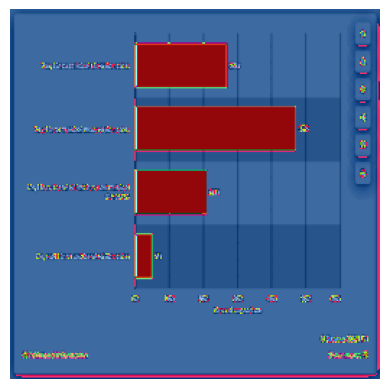

[REFERENCE] statistic shows the share of adults who have ever watched the James <unk> movie franchise in the United States as of November <num>. The <unk> <unk> that <num> percent of responding U.S. adults had watched all of the James <unk> <unk> and <num> percent had watched some movies within
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> of in <unk> <unk> <unk> <unk> of in <unk> <unk> <unk> <unk> <num>, <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk>



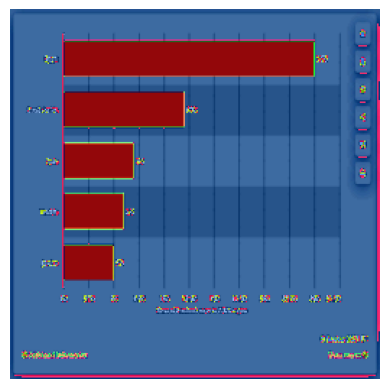

[REFERENCE] statistic provides information on the regional distribution of Facebook users across the <unk> East and North Africa as of June <num>. As of that month, <num> percent of Facebook users from that region were located in <unk>
[PREDICTED] statistic shows the the the the of of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> the <unk> <unk> <unk> <unk> the the <unk> <unk> <unk> of the <unk> <unk> <unk> to <unk> <unk> <unk> <unk> <unk> <unk>



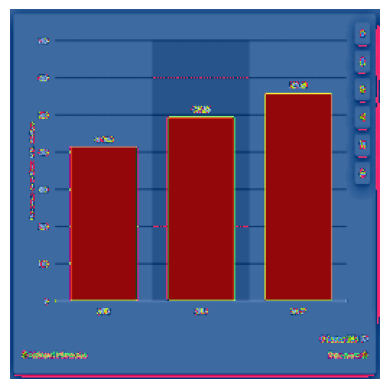

[REFERENCE] statistic depicts the revenue of the <unk> <unk> Canada company from <num> to <num>. In <num>, the health club chain is expected to generate a revenue of <num> million U.S. dollars. In <num>, the Canada based company operated <num> <unk>
[PREDICTED] statistic shows the the of of <unk> of <unk> <unk> <unk> <unk> to of <unk> <num>, the <unk> of <unk> <unk> <unk> the <unk> <unk> <unk> of the <unk> of of <unk> <unk> <unk> of <unk>



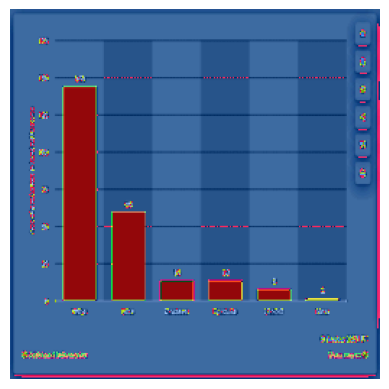

[REFERENCE] <num>,<num> <unk> of <unk> was used for the production of <unk> <unk> in the Netherlands in <num>. The <unk> industry used much more <unk> measured at nearly <num>,<num> <unk>
[PREDICTED] statistic the the the <unk> <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num>, <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



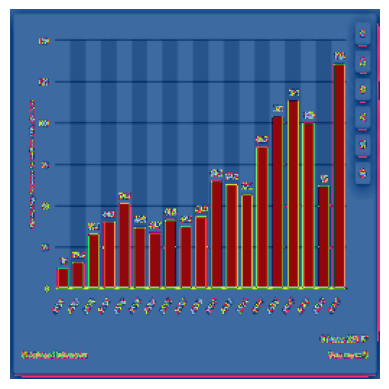

[REFERENCE] statistic depicts the operating income of the <unk> <unk> a franchise of the National Football <unk> from <num> to <num>. In the <num> season, the operating income of the <unk> <unk> was at <num> million U.S. dollars.
[PREDICTED] statistic shows the the of of of <unk> of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> to of <unk> <num>, the of of of of of <unk> <unk> of <unk> <unk> <unk> <unk> of



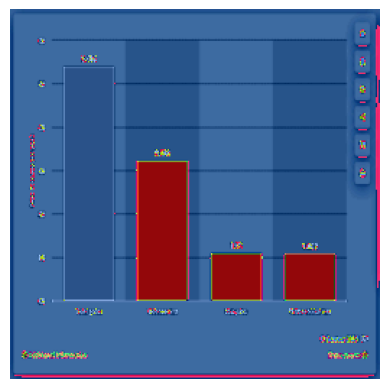

[REFERENCE] statistic shows the price distribution of a <unk> of <num> <unk> in Denmark in <num>. At the time of the survey, the total price for a <unk> of <num> <unk> in Denmark was <num> euros. <unk> of the total <unk> <unk> tax made up for <num> euros. After the
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <num>, <num> of <unk> <unk> of <unk> of of <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of



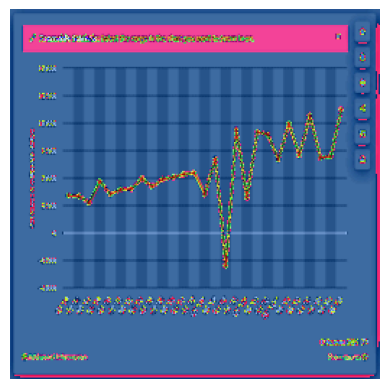

[REFERENCE] the third quarter of <num>, <unk> reported a net income of <num> billion U.S. dollars, an increase from the income of <num> billion U.S. dollars generated in the previous quarter. Company revenues amounted to <num> billion U.S. dollars during the most recently reported period.
[PREDICTED] statistic the of of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> to of <unk> <unk> of <unk> <unk> of of <unk> <unk>



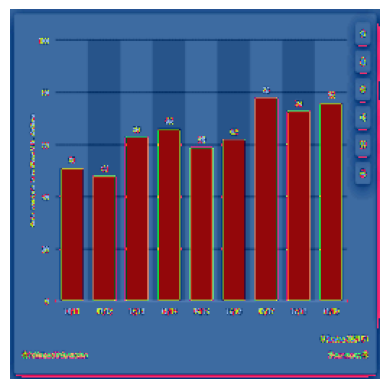

[REFERENCE] statistic depicts the <unk> <unk> sales of the San <unk> <unk> franchise of the National Basketball <unk> from <num>/<num> to <num>/<num>. In the <num>/<num> season, the <unk> <unk> of the San <unk> <unk> were at <num> million U.S. dollars.
[PREDICTED] statistic shows the the of <unk> <unk> the <unk> of in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> to <unk> <unk> <unk> the of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk>



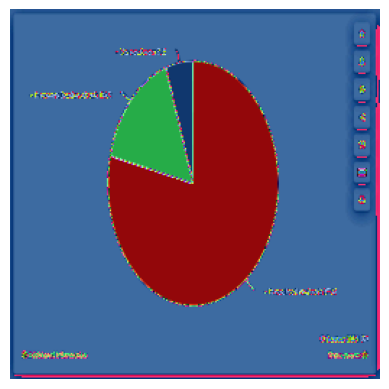

[REFERENCE] to a survey carried out in Mexico in January <num>, approximately <num> percent of respondents believed that coronavirus could lead to <unk> The majority of coronavirus infections have been registered in <unk> China. For further information about the coronavirus (COVID-<num>) pandemic, please visit our dedicated Facts and Figures page.
[PREDICTED] statistic the the of the the the <unk> <unk> United <num> <num> <unk> of the <unk> <unk> the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



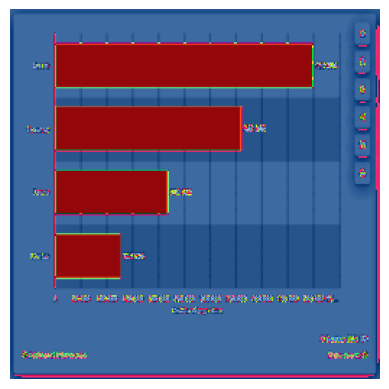

[REFERENCE] statistic displays the leading European countries ranked by the number of <unk> <unk> of <unk> in <num>. In <num>, the total <unk> <unk> of <unk> from Germany amounted to <num>,<num>.
[PREDICTED] statistic shows the the of of of the in <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num>, the <unk> of of <unk> <unk> <unk> <unk> to <unk> <unk> <unk> <unk>



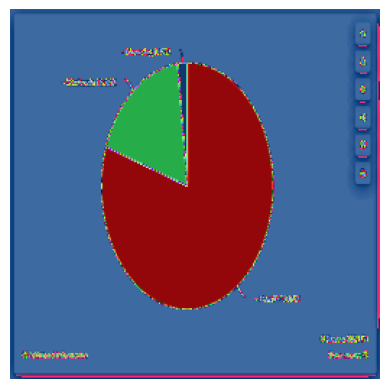

[REFERENCE] statistic displays the revenue share of <unk> in <num>, by distribution channel. Retail was the leading channel for <unk> that year, accounting for over <unk> percent of the company's revenue. <unk> had global revenues of <num> billion British pounds that year.
[PREDICTED] statistic shows the the of of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk>



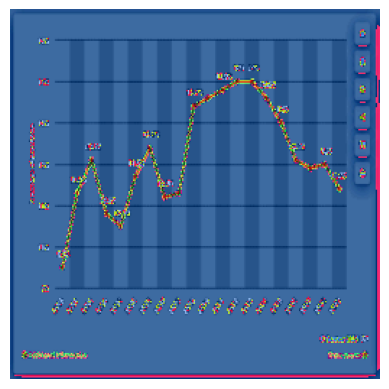

[REFERENCE] statistic shows the poverty rate in <unk> from <num> to <num>. In <num>, about <num> percent of <unk> population lived below the poverty line.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> to of <unk> <num>, the <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> of <unk> <unk>



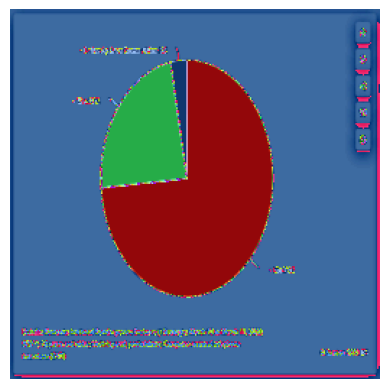

[REFERENCE] <num>, a high percentage of respondents in Romania stated that their professional activities could not be <unk> to the home office system. However, the <unk> of working from home would be possible for <num> percent of people, while three percent <unk> that their work is already <unk> from <unk>
[PREDICTED] statistic the the of of <unk> <unk> <unk> <unk> <unk> the the <unk> <unk> the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> to <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



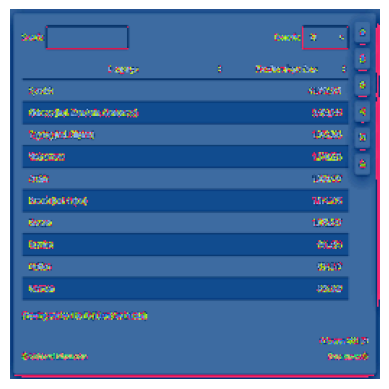

[REFERENCE] graph shows the top <num> <unk> <unk> other than <unk> in the United States. In <num>, around <num> million people in the U.S. <unk> Spanish at <unk> The distribution of the U.S. population by <unk> can be accessed here. A ranking of the most <unk> <unk> across the world
[PREDICTED] statistic shows the the of of of <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> the <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



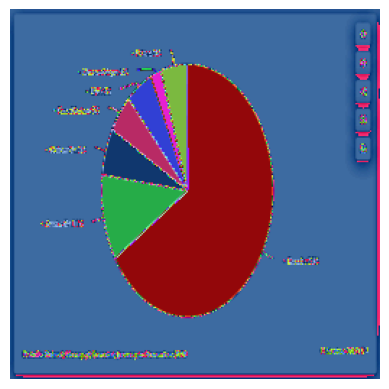

[REFERENCE] January and November <num>, Poland imported <num> million tons of coal from <unk> according to <unk> data, of which <num> percent were imported from <unk>
[PREDICTED] statistic the the the the <unk> <unk> the of in in <unk> <unk> to <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> the to <unk>



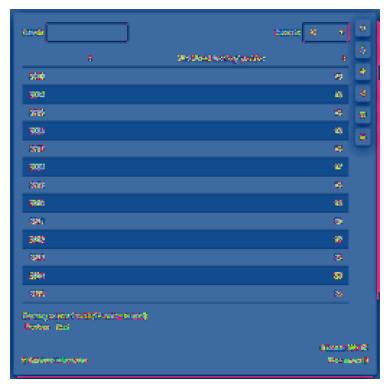

[REFERENCE] statistic shows the FIFA World Ranking of the Finnish women's national football team from <num> to <num>. From <num> to <num>, the team reached <unk> position <num>, which was the <unk> highest <unk> Rank <num> was the lowest result of <unk> women's national team, which was reached in <num>.
[PREDICTED] statistic shows the the of of of the <unk> of in in in <unk> in to of <unk> <num>, the of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



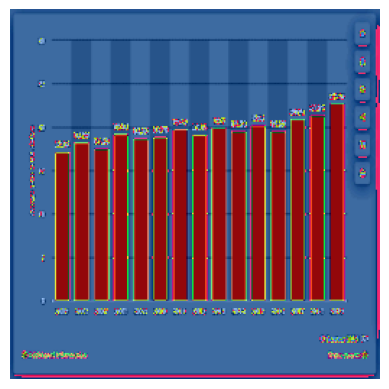

[REFERENCE] statistic shows the average price for a basic <unk> in <unk> <unk> in the United States from <num> to <num>. <unk> <unk> in the U.S. <unk> an average price of <num> U.S. dollars for a basic <unk> in <num>.
[PREDICTED] statistic shows the the of of the <unk> of in <unk> <unk> <unk> <unk> <unk> of <unk> <unk> to <num>. In <num>, the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk>



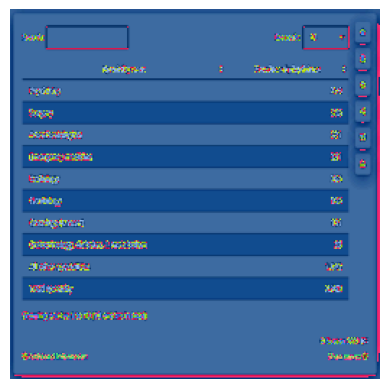

[REFERENCE] statistic depicts the number of active physicians in <unk> as of March <num>, ordered by specialty area. At that time, there were <num> anesthesiologists active in <unk> In total, there were over <num>,<num> active physicians in <unk> at that time.
[PREDICTED] statistic shows the the of of <unk> in <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <num> the <unk> <num> <unk> of <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk>



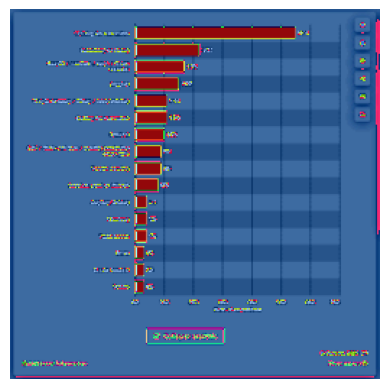

[REFERENCE] most popular sport or physical <unk> in <unk> Ireland is <unk> for <unk> When it comes to specific types of <unk> <unk> <unk> <unk> and cycling are the most <unk> sports in <unk> <unk> <unk> <unk> to be rather similar between women and men, <unk> that men tend to
[PREDICTED] statistic shows the the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



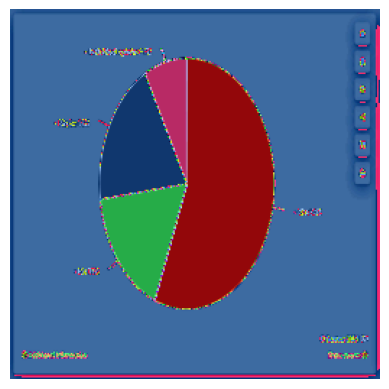

[REFERENCE] to the coronavirus (COVID-<num>) pandemic, many employees were working from home as of March <num>. Most of them were <unk> with this situation - <num> percent <unk> they <unk> the home <unk> and only <num> percent did not like it. For further information about the coronavirus (COVID-<num>) pandemic, please
[PREDICTED] statistic the the of the the the <unk> the in in to in <unk> <unk> in <num>, the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> the the <unk> of <unk> <unk> <unk>



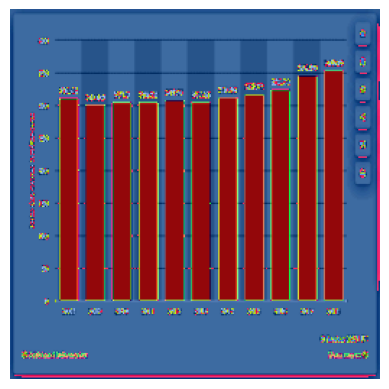

[REFERENCE] statistic displays the annual <unk> <unk> revenue related to <unk> in Spain from <num> to <num>. In <num>, the annual <unk> <unk> revenue of <unk> amounted to approximately <num> million euros, which represented over eight million euros more than the previous year.
[PREDICTED] statistic shows the the of of <unk> <unk> the <unk> <unk> <unk> <unk> <unk> to of <unk> <num>, the <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of of <unk> <unk>



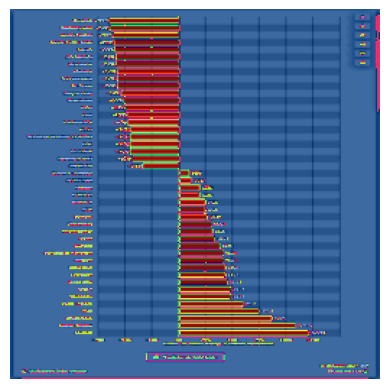

[REFERENCE] outbreak of coronavirus in Poland had a significant impact on <unk> shopping <unk> Some of the most <unk> increases in terms of the number of <unk> transactions were recorded in March <unk> for services from the computer games industry. The leaders of the ranking were Steam Games <unk> <unk>
[PREDICTED] statistic shows the <unk> the <unk> <unk> <unk> of <unk> the <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <unk> <unk> <unk> to of <unk> <unk> <unk> <unk> the <unk> of <unk> <unk> <unk> <unk> <unk>



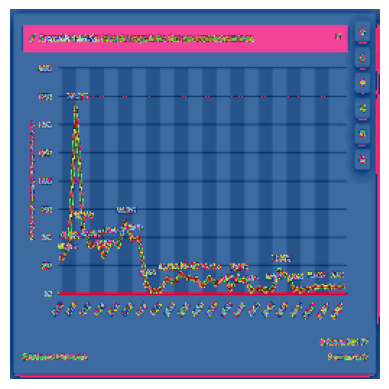

[REFERENCE] statistic shows the average inflation rate in <unk> from <num> to <num>, with projections up until <num>. In <num>, the inflation rate in <unk> amounted to about <num> percent compared to the previous year.
[PREDICTED] statistic shows the the of of in <unk> <unk> <unk> to of <unk> <unk> <num> <unk> the <unk> the the <unk> of <unk> <unk> <unk> <unk> <num> <num> <unk> of the of <unk>



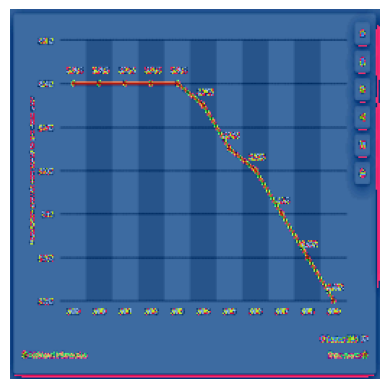

[REFERENCE] statistic shows the population change in Sub-Saharan Africa from <num> to <num>. Sub-Saharan Africa includes almost all countries south of the <unk> <unk> In <num>, Sub-Saharan <unk> population increased by approximately <num> percent compared to the previous year.
[PREDICTED] statistic shows the the of of the in in <unk> to of In <num>, the <num>, the the the the the <unk> of <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the the <unk> of <unk> <unk>



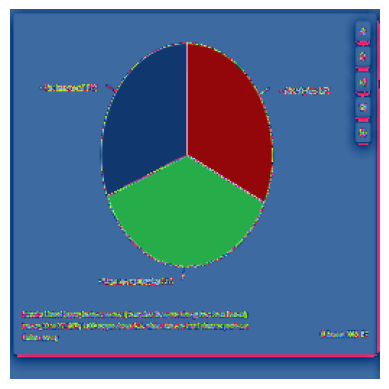

[REFERENCE] to the survey, <num> percent of consumers in the United States were <unk> in starting to purchase <unk> <unk> skin care products. Around <num> percent of U.S. consumers stated that they were not <unk> in purchasing <unk> skin care products.
[PREDICTED] statistic the the of of of the <unk> <unk> <unk> of in <unk> in <unk> <unk> <num> <num> <num> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



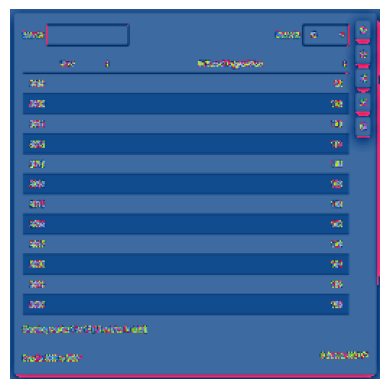

[REFERENCE] of March <num>, the Puerto Rican women's soccer team ranked <num>th in the FIFA world ranking, slightly down from the <num>th position achieved in the previous year.
[PREDICTED] statistic the <num>, the the of <unk> <unk> <unk> <unk> <unk> in the <unk> of <unk> <unk> <unk> the <unk> to of <unk> <unk> the <unk> of <unk> the



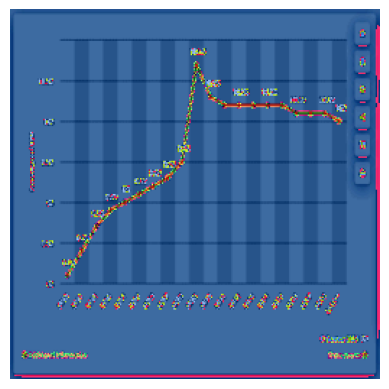

[REFERENCE] total health care expenditure in Denmark as a percentage of the country's GDP <unk> domestic <unk> peaked in <num>, when it reached <num> percent. The share was relatively stable during the past <unk> and was estimated to <num> percent in <num>.
[PREDICTED] statistic shows the the the the <unk> the the of <unk> <unk> of in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of the



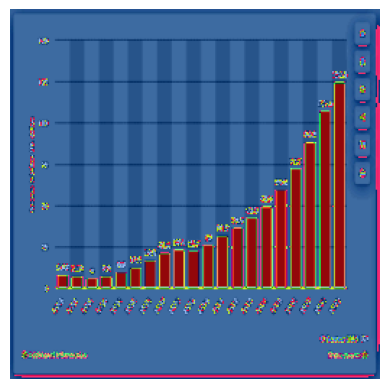

[REFERENCE] advertising revenue in the United States grew by <num> percent in <num> compared to <num>, from <num> billion <unk> billion U.S. dollars. A year <unk> was the first time the figure has surpassed <num> billion dollars, <unk> to the <unk> of new channels and <unk> including <unk> and <unk>
[PREDICTED] statistic the the the <unk> of of <unk> <unk> <unk> of the <unk> of the the <unk> to of of the <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



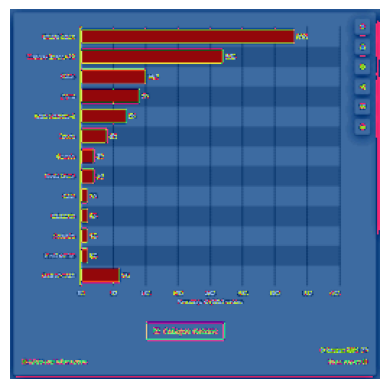

[REFERENCE] <num>, the United States, followed by (the leading <num> countries <unk> Western Europe, had that largest share of pharmaceutical revenue <unk> For comparison, Australia had one of the lowest single shares among the listed countries. The data shows that the United States held <num> percent of global pharmaceutical revenue.
[PREDICTED] statistic the the of of of <unk> <unk> <unk> <unk> of the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of of <unk> <unk> of the <unk> <unk> <unk>



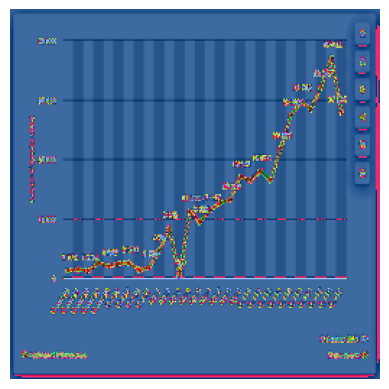

[REFERENCE] tested around <num>,<num> <unk> for the coronavirus (COVID-<num>) on April <num>, <num>. Of <unk> <num>,<num> <unk> were found to be positive for the coronavirus. <unk> the country reported to have <unk> tested <num>,<num> <unk> from <num>,<num> individuals as of that day. For further information about the coronavirus (COVID-<num>) pandemic,
[PREDICTED] statistic the the the the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> of <unk> <unk>



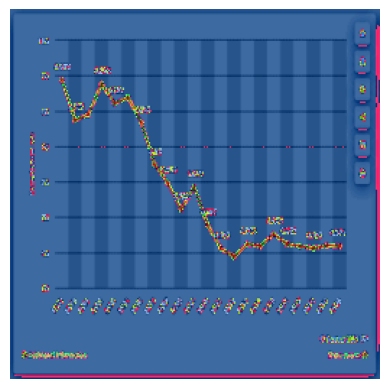

[REFERENCE] statistic shows the unemployment rate in <unk> <unk> from <num> to <num>. In <num>, the unemployment rate in <unk> <unk> was at approximately <num> percent.
[PREDICTED] statistic shows the the of of <unk> in <unk> <unk> to of <unk> <num>, the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <num> <unk> of



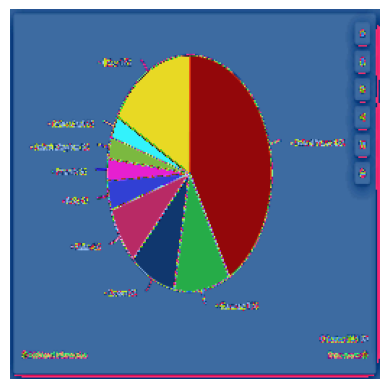

[REFERENCE] statistic shows the <unk> food retail sales share worldwide in <num>, broken down by country. According to the report, the United States accounted for approximately <num> percent of global <unk> retail sales that year.
[PREDICTED] statistic shows the the of <unk> <unk> <unk> the the the <unk> <unk> <unk> <num> <unk> <unk> the <unk> of <unk> of in <unk> <num> <unk> <unk> of the <unk> <unk> <unk> <unk> the <unk> the



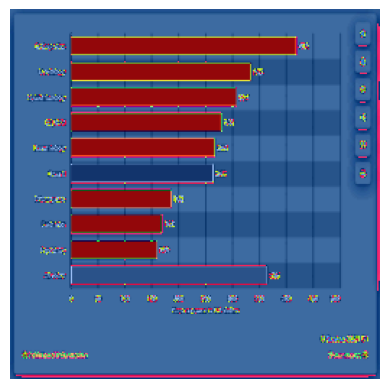

[REFERENCE] statistic shows the total mean expenses per <unk> <unk> visit in the United States in <num>, by <unk> The mean total <unk> per office based <unk> visit in the specialty of <unk> stood at <num> U.S. dollars, whereas the overall mean <unk> was <num> U.S. dollars.
[PREDICTED] statistic shows the the of of of of in <unk> <unk> <unk> <unk> of in <unk> <unk> <num> <num> <unk> <unk> <unk> <num> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> of



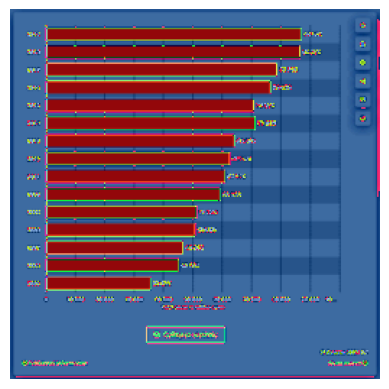

[REFERENCE] statistic shows the total assets of <unk> from <num> to <num>. <unk> is the largest <unk> chemical company worldwide and is headquartered in <unk> Germany. In <num>, <unk> had total assets of around <num> billion euros.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> to of <unk> <num>, the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk>



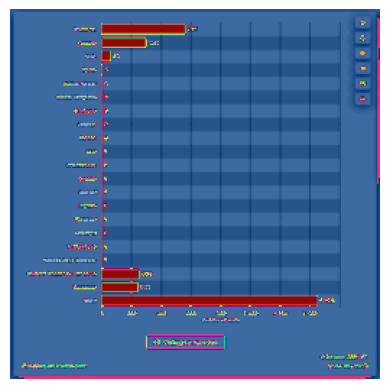

[REFERENCE] highest number of Danish confirmed coronavirus (COVID-<num>) cases as of March <num>, <num>, reported to have been infected in <unk> and amounted to <num>. <num> of Danish confirmed cases originated from <unk> The first case of the coronavirus in Denmark was confirmed on February <num>, <num>. The number of
[PREDICTED] statistic shows the the <unk> <unk> the the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the of <unk> <unk> the <unk> to <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> the <unk> <unk>



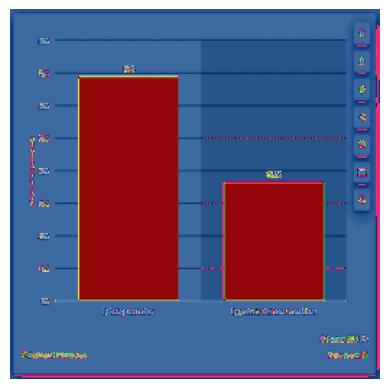

[REFERENCE] of March <num>, <num>, there were nearly <num> thousand cases of novel coronavirus worldwide. Although only <num> cases were reported in Latin America, more than a third of <unk> surveyed in January <num> believed that coronavirus could be <unk> by any product that came from <unk> coronavirus <unk> the
[PREDICTED] statistic the <num>, the the <unk> <unk> <unk> the of in the <unk> <unk> <unk> <unk> <unk> the of the the the <unk> <unk> the the of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> to <unk> <unk> <unk>



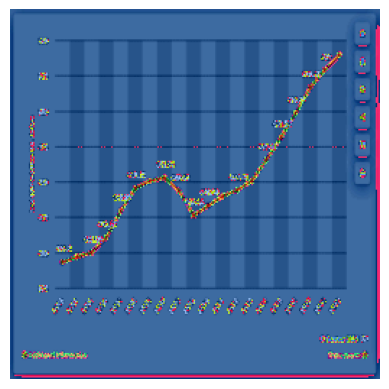

[REFERENCE] statistic shows the development of <unk> real GDP from <num> to <num>. In <num>, the real GDP of Georgia was about <num> billion U.S. dollars. The annual real GDP growth of the U.S. can be accessed here.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> to of <unk> <num>, the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



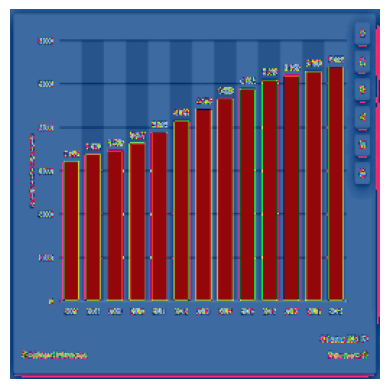

[REFERENCE] <num>, <unk> chain <unk> <unk> had a total of approximately <num>,<num> restaurants worldwide, up from <num>,<num> the previous year. This figure has been steadily growing for <num> years. <unk> <unk> place in the U.S. market <unk> <unk> ranked in fourth place in terms of U.S. sales when compared to
[PREDICTED] statistic the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> to <unk> of <unk> <unk> the the the the <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



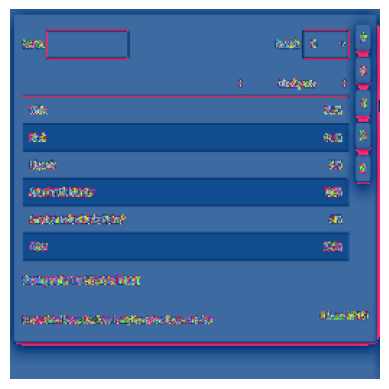

[REFERENCE] statistic depicts the obesity rates for adults in <unk> in <num>, by ethnicity. In that year, <num> percent of all black adults in <unk> were obese.
[PREDICTED] statistic shows the the of of <unk> <unk> in in <unk> <unk> <unk> <unk> <unk> the the <num> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



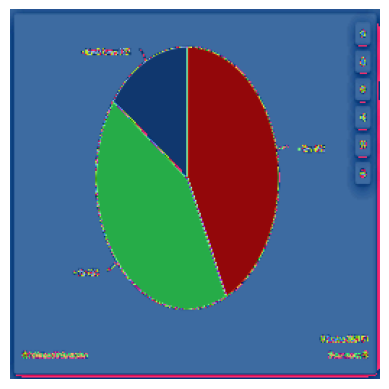

[REFERENCE] a survey of <num>, <num> percent of Italian respondents thought that <unk> people should not be able to change their civil <unk> to match their gender <unk> A survey conducted in <num> shows that respondents in Italy believed that discrimination related to the <unk> <unk> was one of the
[PREDICTED] statistic the of the <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> of <unk> <unk> <unk> <unk> <unk>



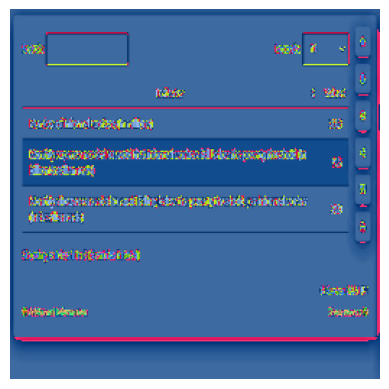

[REFERENCE] of March <num>, during the outbreak of the novel coronavirus <unk> which causes the <unk> there were more than <num> million <unk> <unk> people in Brazil. It has been calculated that, in order to <unk> them from falling below the poverty <unk> each <unk> <unk> would need an income
[PREDICTED] statistic the <num>, the the the of of <unk> of in in <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> to <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



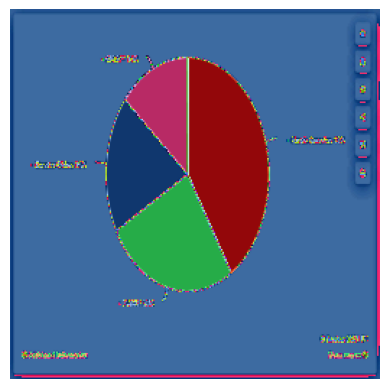

[REFERENCE] <num>, revenue generated in North America accounted for <num> percent of <unk> total <unk> That year, <unk> North American revenue amounted to about <num> billion U.S. dollars.
[PREDICTED] statistic the the the the <unk> the the <num> the of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of



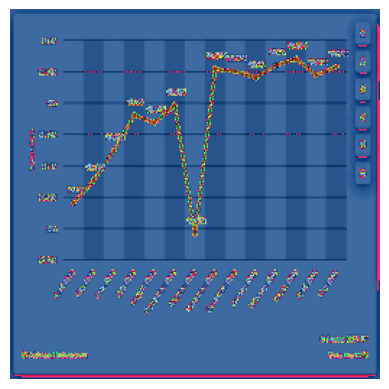

[REFERENCE] had a clear <unk> on the mobile search <unk> market across India with a share of <num> percent as of May <num>. This stood at <num> percent in September <num>, <unk> a clear picture regarding the rise of Google as the biggest <unk> to any other search <unk> operator
[PREDICTED] statistic shows the of the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> the <unk> of <unk> <unk> of the the <unk> <unk> the the the the of the <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



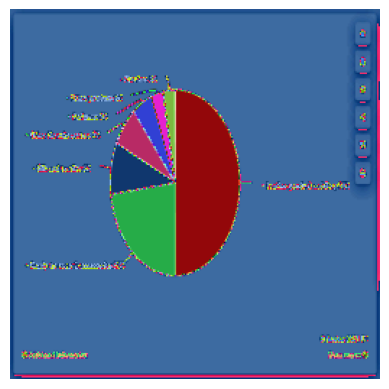

[REFERENCE] statistic shows the revenue share of <unk> worldwide in <num>, broken down by segment. In <num>, the revenue share of <unk> <unk> segment amounted to about three percent. <unk> is a <unk> company for luxury goods and apparel, headquartered in <unk> France.
[PREDICTED] statistic shows the the of of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the the <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



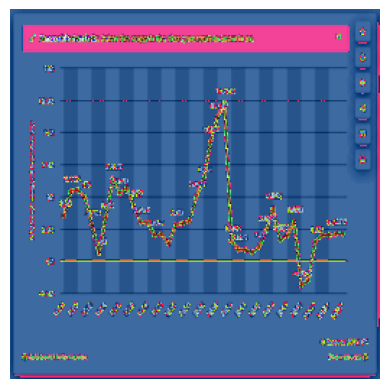

[REFERENCE] <num>, the inflation rate of the United <unk> <unk> was at <num> percent compared to the previous year. For <num>, estimates show a sharp increase of over <num> percent, before inflation <unk> back to around <num> percent in <num>. <unk> is <unk> <unk> <unk> The economy of the United
[PREDICTED] statistic the the of of <unk> <unk> of in <unk> <unk> <unk> <unk> of the the <unk> of <unk> the <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



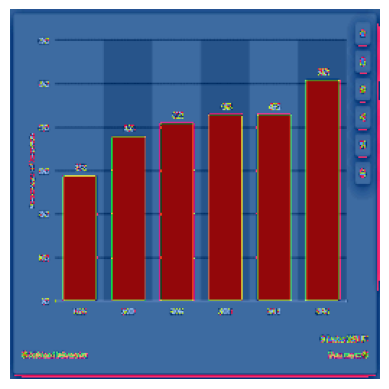

[REFERENCE] statistic depicts the percentage of hospitals in <unk> hospital systems in the United States from <num> to <num>. According to the data, in <num>, <num> percent of hospitals were in <unk> <unk> As of <num>, <num> percent of hospitals were in <unk> <unk>
[PREDICTED] statistic shows the the of of <unk> <unk> in <unk> <unk> <unk> <unk> of in <num> to <num>. In <num>, the the of <unk> <unk> <unk> of the <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk>



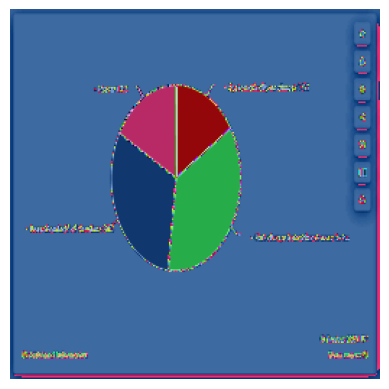

[REFERENCE] statistic shows the proportion of men being able or not to <unk> their <unk> during <unk> <unk> to make it last longer in France in <num>. <unk> thus <unk> that a <unk> more than half of French men were able to <unk> the <unk> in this <unk> <unk> it
[PREDICTED] statistic shows the the of of <unk> <unk> in in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



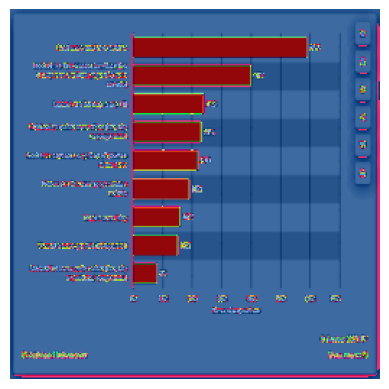

[REFERENCE] statistic displays the types of online news used by respondents aged <num> to <num> in the United Kingdom in <num>. Among young people, <num> percent reported looking at news <unk> while <num> percent read news <unk> or <unk> During the survey, <num> percent of respondents of all <unk> reported
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> in of <unk> of <num>, of in of <num> <num>, the the the of the the the the the <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk>



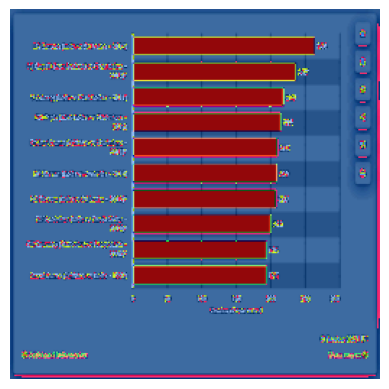

[REFERENCE] statistic shows the highest <unk> score in One <unk> International <unk> as of September <num>, by <unk> <unk> <unk> of India scored a <unk> <num> against <unk> <unk> in <num>.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk>



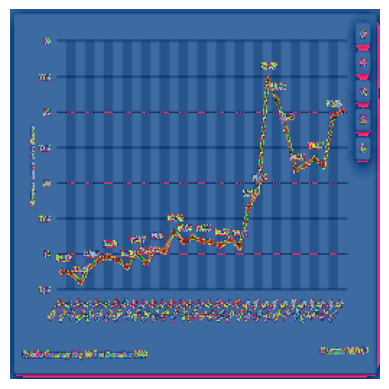

[REFERENCE] statistic shows the number of unique users of <unk> in Germany from May <num> to November <num>. In November <num>, roughly <num> million visitors accessed the news <unk>
[PREDICTED] statistic shows the the of of <unk> <unk> in <unk> <unk> <unk> <unk> to to of In <unk> <num>, the the <unk> <unk> of <unk> of <unk> <unk>



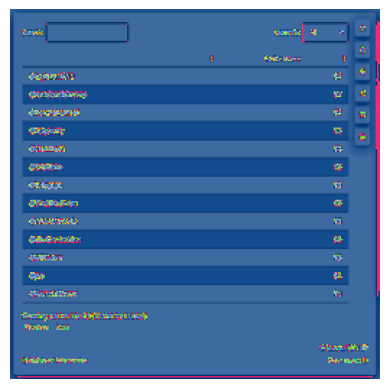

[REFERENCE] <num>, <unk> <unk> <unk> was ranked as the most <unk> <unk> user worldwide. The American <unk> has over <num> million followers on the <unk> Other <unk> included <unk> <unk> <unk> <unk> <unk> <unk> and <unk> <unk> <unk> <unk> were ranked on the level of <unk> <unk> users created within
[PREDICTED] statistic the the the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



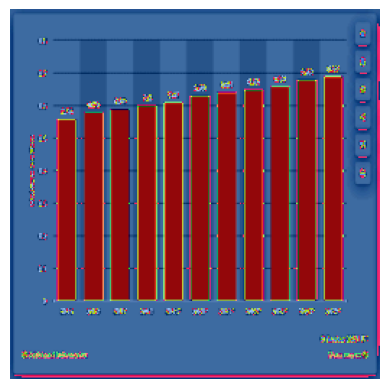

[REFERENCE] statistic shows the total population of <unk> from <num> to <num> with <unk> up to <num>. In <num>, the total population of <unk> was approximately <num>,<num> inhabitants.
[PREDICTED] statistic shows the the of of the <unk> <unk> to of <unk> of <unk> the the <unk> <num>, the <unk> of of <unk> <unk> <unk> <unk> <unk> <unk>



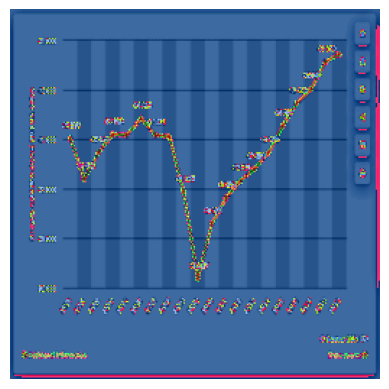

[REFERENCE] statistic shows the per capita real Gross <unk> Product of Michigan from <num> to <num>. In <num>, the per capita real GDP of Michigan stood at <num>,<num> chained <num> U.S. dollars.
[PREDICTED] statistic shows the the of of of <unk> in <unk> the <unk> <unk> to of <unk> <num>, the the of of <unk> <unk> <unk> <unk> <unk> the <unk> of



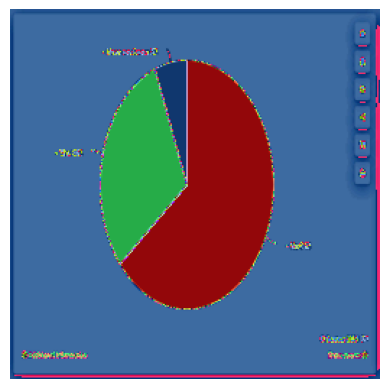

[REFERENCE] to a survey carried out in Chile on March <num> <num>, <num> percent of respondents did not agree that the government had taken <unk> and <unk> <unk> to <unk> the novel coronavirus <unk> causes the <unk> crisis. According to the same survey, <num> percent of <unk> respondents said the
[PREDICTED] statistic the the of the the the <unk> <unk> <unk> <unk> of <unk> of the <unk> <unk> <unk> <unk> the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk>



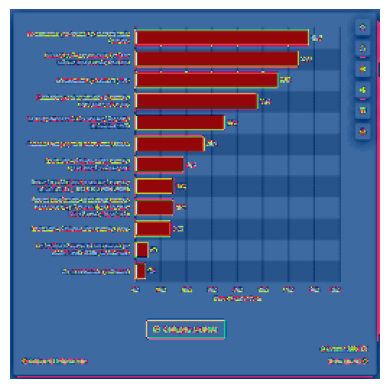

[REFERENCE] a survey conducted in the middle of <num> it was found that <num> percent of organizations <unk> the <unk> and <unk> of their information security <unk> through <unk> <unk> by <unk> <unk> <unk>
[PREDICTED] statistic the the the the <unk> of <unk> <unk> of <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



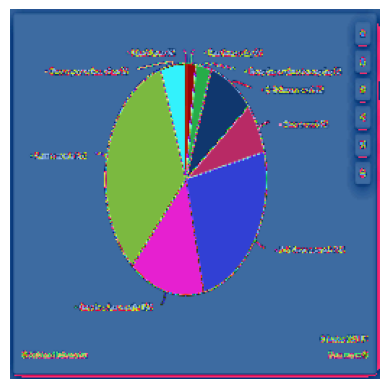

[REFERENCE] statistic shows how often parents <unk> <unk> or <unk> of their children to the internet in Poland in <num>. The <unk> <unk> is the <unk> of social media by parents to share too much <unk> <unk> According to the survey, <num> percent of parents <unk> a <unk> or a
[PREDICTED] statistic shows the the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <num>, <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk>



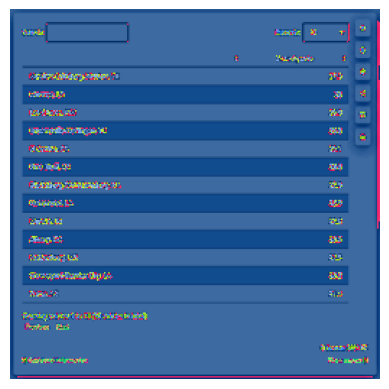

[REFERENCE] statistic shows the <num> metropolitan areas with the highest poverty rate in the United States in <num>. The <unk> metropolitan area in Texas was ranked first with <num> percent of its population living below the poverty level in <num>.
[PREDICTED] statistic shows the the of of of <unk> in of of in <unk> in of in in from <num>, <unk> <unk> <unk> <unk> <unk> <unk> <num> <unk> <num> <num> of the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> the



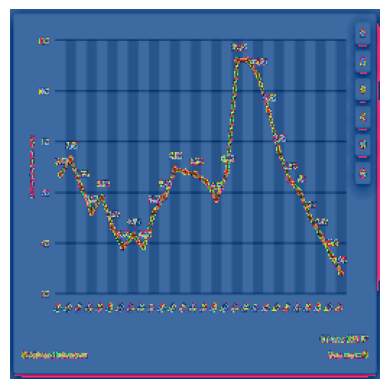

[REFERENCE] statistic displays the unemployment rate in South <unk> from <num> to <num>. In <num>, the unemployment rate in South <unk> was <num> percent. This is down from a high of <num> percent in <num> and <num>.
[PREDICTED] statistic shows the the of of <unk> in in <unk> to of <unk> <num>, the <num> of <unk> <unk> <unk> <num> <num> <num> of to <unk> <unk> <unk> of the of



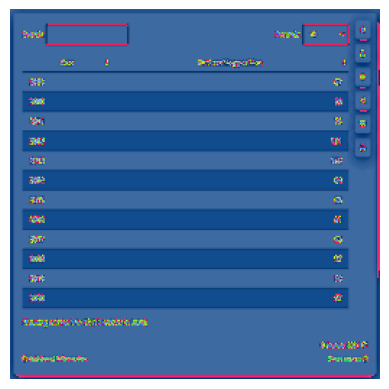

[REFERENCE] of March <num>, the <unk> women's soccer team ranked <num>th in the world, slightly up from the <num>th position achieved by the end of <num>.
[PREDICTED] statistic the <num>, the the of <unk> <unk> <unk> <unk> <unk> the <unk> of <unk> <unk> the to of <unk> <unk> the <unk> of <unk> <unk> the



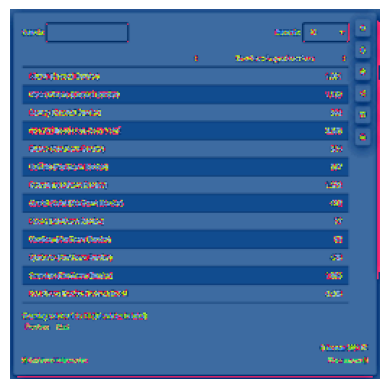

[REFERENCE] statistic above represents the number of <unk> by the U.S. <unk> <unk> sorted by <unk> sector. In the fiscal year of <num>, a total of <num>,<num> <unk> were counted in <unk> <unk> formerly known as <unk>
[PREDICTED] statistic shows the the the of of <unk> <unk> <unk> of in <unk> <unk> <unk> <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



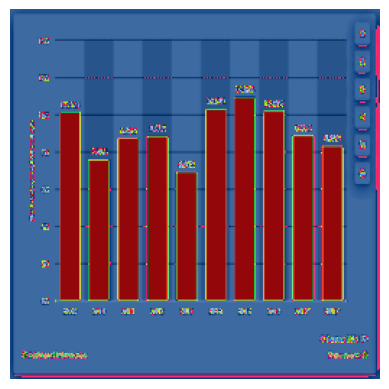

[REFERENCE] statistic presents the development of the annual <unk> interest rate for <unk> between <num> and <num>, with further projections for <num> and <num>. <unk> <unk> interest rate was at a low of <num> percent in <num> and it peaked just two year later in <num> at <num> percent. Nevertheless,
[PREDICTED] statistic shows the the of of <unk> of in <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> the the the of <unk> the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the of <unk> <unk> of of



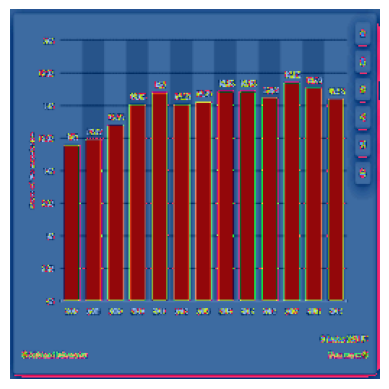

[REFERENCE] statistic displays the share of the population with high <unk> <unk> in the Netherlands from <num> to <num>. Between <num> and <num>, the share of the population with high <unk> overall <unk> However, the share reached a peak of <num> percent in <num> and has since then <unk>
[PREDICTED] statistic shows the the of of <unk> of in in in <unk> <unk> <unk> of <unk> to of <unk> <num>, the of the <unk> of of <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> of the <unk> of <unk> <unk>



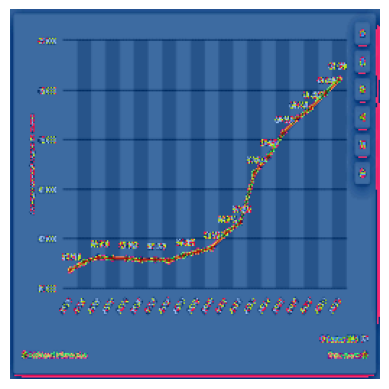

[REFERENCE] of <num>, the average annual wage of Germany was <num> thousand <unk> per year, a growth of just over <num> thousand <unk> when compared with <num>. From <num> until <num>, wages rose by less than a thousand euros, with wage growth <unk> mainly in the period after <num>. The
[PREDICTED] statistic the <num>, the of of in in <unk> in <unk> of in <unk> the <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> the <unk> the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk>



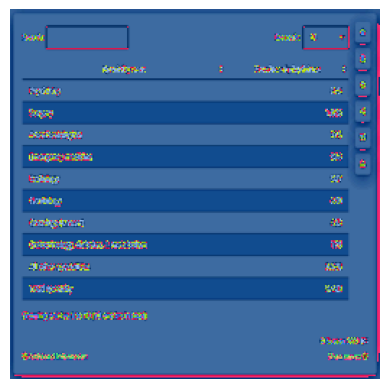

[REFERENCE] statistic depicts the number of active physicians in Minnesota as of March <num>, ordered by their specialty area. At that time, there were <num> anesthesiologists active in <unk> There are some <num>,<num> total active physicians in the state.
[PREDICTED] statistic shows the the of of <unk> in <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> the the <unk> the <unk> <num> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



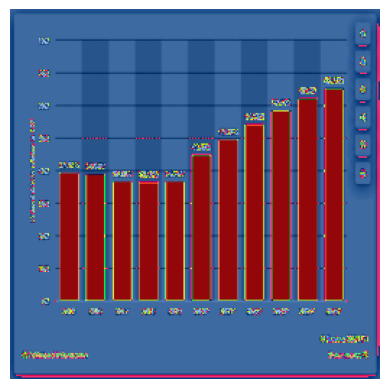

[REFERENCE] statistic shows the national debt of Romania from <num> to <num> in relation to the gross domestic product <unk> with projections up until <num>. The figures <unk> to the whole country and include the <unk> of the state, the <unk> the <unk> and the social <unk> In <num>, the
[PREDICTED] statistic shows the the of of of <unk> <unk> to of <unk> of <num>, the <num> of of <unk> the <unk> <unk> <unk> the <unk> the <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> of <unk> <unk> of <unk> <unk> the <unk>



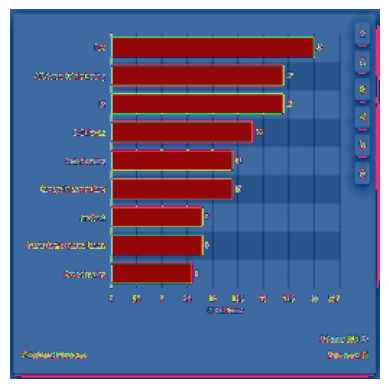

[REFERENCE] statistic presents the leading financial <unk> firms (including investment <unk> to merger and acquisition deals in Norway in <num>, ranked by deal <unk> In that time, <unk> emerged as the leading <unk> to M&A deals in <unk> with a transaction <unk> of <num> deals in <num>.
[PREDICTED] statistic shows the the of of of <unk> the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <num> <num> <num> <unk> the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk>



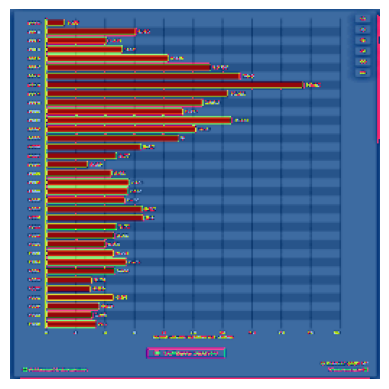

[REFERENCE] graph shows the growth in the U.S. export volume of trade goods to <unk> from <num> to <num>. In <num>, U.S. exports to <unk> amounted to <num> billion U.S. dollars.
[PREDICTED] statistic shows the the of of <unk> of in in <unk> <unk> <unk> <unk> <unk> <unk> to of <unk> <num>, the <unk> <unk> <unk> <unk> <unk> <unk> <unk> of



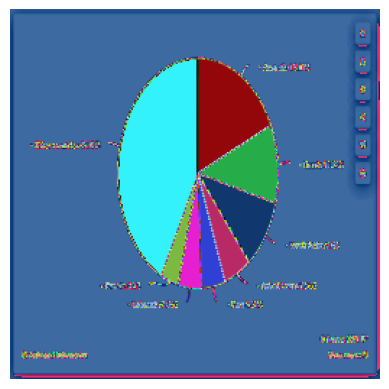

[REFERENCE] statistic shows the distribution of gold reserves worldwide in <num>, by selected country. In that year, Australia had the world's largest gold <unk> with a share of <num> percent of the total gold reserves worldwide.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the the the <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk>



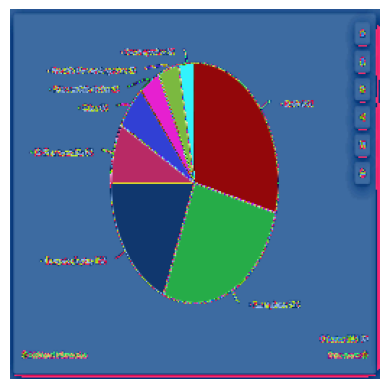

[REFERENCE] to a global study held in <num>, internet users spent <num> percent of their music listening time on their <unk> but most time listening to music was <unk> via <unk> <unk> more time was spent listening to music on a <unk> or <unk> <unk> <unk> than via a smart
[PREDICTED] statistic the the of the the the <unk> <unk> <unk> <unk> the of the <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



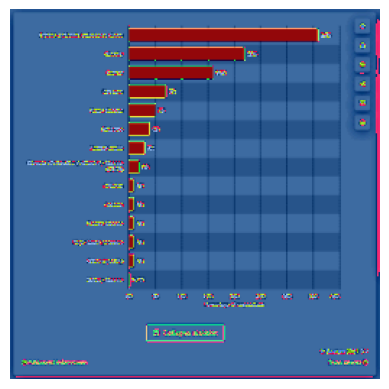

[REFERENCE] survey displays the share of people in West <unk> about what they <unk> is the most important health issue faced in their state, as of September <num>. As much as <num> percent of the survey respondents believe that <unk> <unk> <unk> is the most important health issue being faced
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



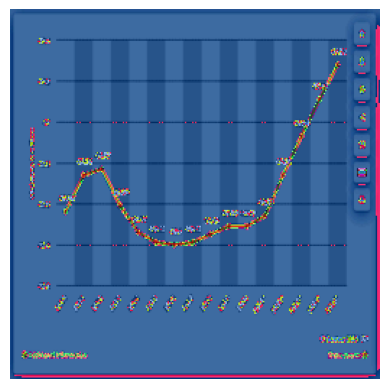

[REFERENCE] statistic shows the total population of Spain from <num> to <num>, with projections up until <num>. In <num>, the total population of Spain was around <num> million people. Population of Spain While <unk> fertility rate has been relatively steady over the past <unk> its <unk> population growth has been
[PREDICTED] statistic shows the the of of the <unk> <unk> to of <unk> <unk> <unk> <unk> the <unk> the the <unk> of of <unk> <unk> <unk> <unk> <unk> of <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



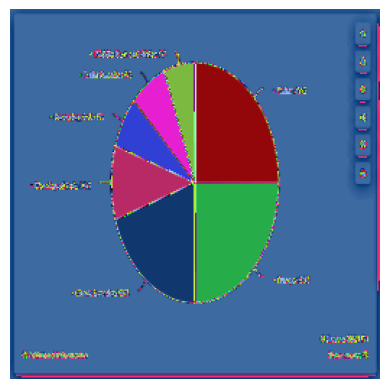

[REFERENCE] in China, Europe, and North America are forecast to account for <num> percent of the global market share of <unk> consumer goods in <num>. China's share of <num> percent is forecast to be <unk> than the combined share of <num> percent for all other countries in developed and emerging
[PREDICTED] statistic shows the the the <unk> the the the the <unk> <unk> <unk> of the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk>



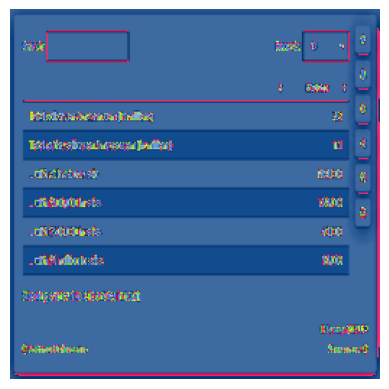

[REFERENCE] <num>, there were <num> million active <unk> from the United States <unk> goods via <unk> Approximately a third of those <unk> had at least one sale during the measured period, and <num>,<num> <unk> generated at least <num>,<num> U.S. dollars in <unk> <unk> sales.
[PREDICTED] statistic the the the the of in <unk> <unk> to of in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



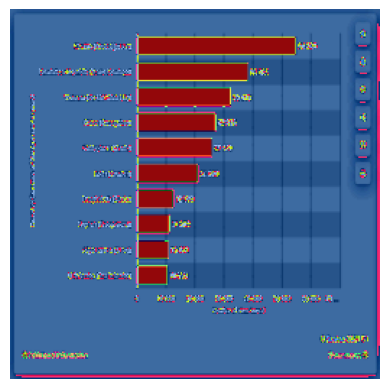

[REFERENCE] statistic shows the leading international <unk> that issued United States <unk> <unk> in the fiscal year of <num>. The most <unk> <unk> in the fiscal year of <num> were <unk> in Mexico, <unk> <unk> with <num>,<num> total <unk>
[PREDICTED] statistic shows the the of of the <unk> the <unk> in <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <num>, <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



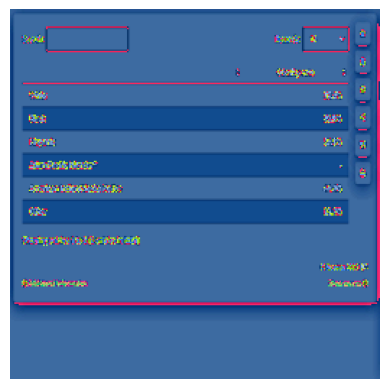

[REFERENCE] statistic depicts the obesity rates for adults in <unk> in <num>, by ethnicity. In that year, <num> percent of all white adults in <unk> were obese. <unk> <unk> that could lead to being overweight and obese is often <unk> due to a lack of <unk> <unk> <unk> such as
[PREDICTED] statistic shows the the of of <unk> <unk> in in <unk> <unk> <unk> <unk> <unk> the the <num> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



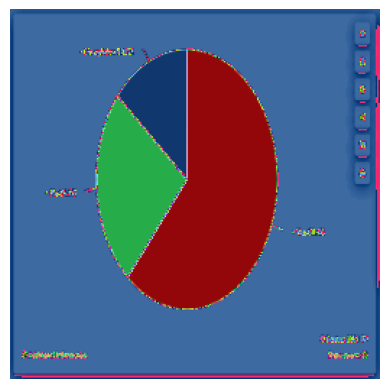

[REFERENCE] case of coronavirus (COVID-<num>) was confirmed in Poland as of February <num>, <num>. Nevertheless, more than <num> percent of the society <unk> that Poland is not prepared for a possible virus <unk>
[PREDICTED] statistic the the <unk> the <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> the the the the of the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



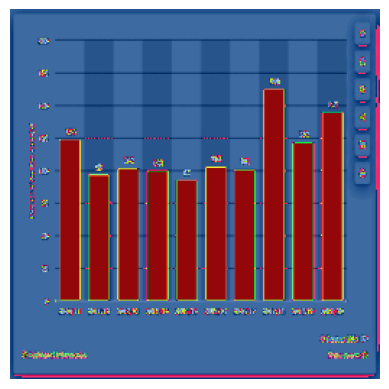

[REFERENCE] <num> <unk> recorded by the London Metropolitan <unk> in <num>/<num> occurred following an <num> percent increase from the previous year, when there were <num> <unk> <unk> Although this as still <unk> than the <num> recorded in <num>/<num>, it was far higher than in any year between <num>/<num> and <num>/<num>,
[PREDICTED] statistic shows of the the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> the <unk> of the the to of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



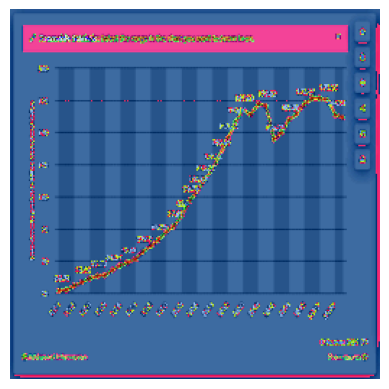

[REFERENCE] statistic shows gross domestic product (GDP) in <unk> from <num> to <num>. Gross domestic product (GDP) denotes the aggregate value of all services and goods produced within a country in any given year. GDP is an important indicator of a country's economic power. In <num>, <unk> estimated gross domestic
[PREDICTED] statistic shows the the the of the the in <unk> to of <unk> <num>, <num>, the the the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk>



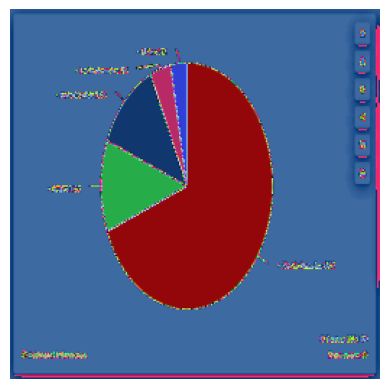

[REFERENCE] <unk> company Under Armour generated <num> percent of their net revenues from its home region of North America in <num>. The revenue share from the <unk> region was twelve percent that year. <unk> is the <unk> market <unk> other <unk> The total net revenue of Under Armour has increased
[PREDICTED] statistic the the <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> to <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> the the to of <unk> <unk> <unk> <unk> the the the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



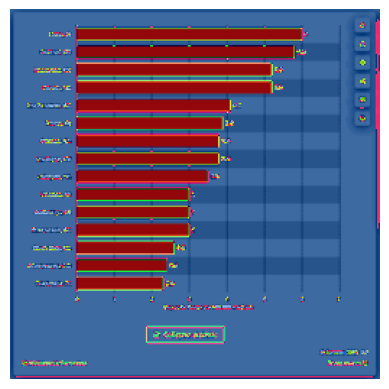

[REFERENCE] statistic shows the cities with the largest number of <unk> dog parks per <num>,<num> residents in the United States in <num>. The city of <unk> had <num> <unk> dog parks per <num>,<num> residents in <num>.
[PREDICTED] statistic shows the the of of in of in in <unk> <unk> <unk> <unk> the in <unk> <unk> of in <num> <num> the the <unk> <unk> <unk> of <unk> <unk> <unk>



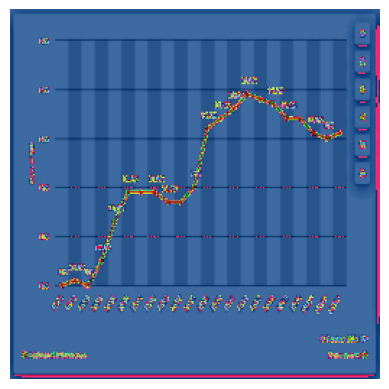

[REFERENCE] <num>, the total health expenditure made up around <num> percent of total GDP in the Netherlands. This is <unk> due to the health insurance system. In the <unk> every resident or <unk> is <unk> to take a basic health insurance to <unk> medical costs <unk> for example, visits to
[PREDICTED] statistic the the of of of <unk> the the the of the <unk> <unk> <unk> <unk> of <unk> <unk> the <unk> <unk> <unk> of <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



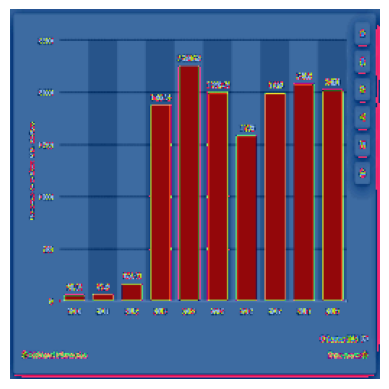

[REFERENCE] in Sweden in <num>, <unk> is a video game <unk> that is most famous for its <unk> gaming <unk> <unk> <unk> <unk> The <unk> revenue reached <num> billion U.S. dollars in <num>, a marked increase from revenue of less than <num> million U.S. dollars in <num>. <unk> of the
[PREDICTED] statistic the the the <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> to the <unk> <unk> <unk> of <unk>



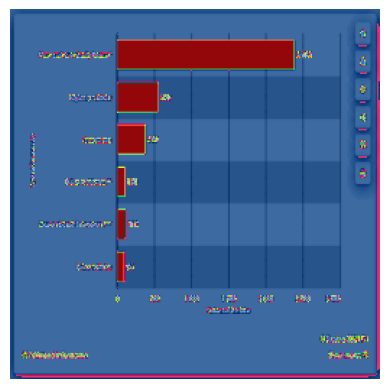

[REFERENCE] <num>, <unk> in <unk> and <unk> <unk> accounted for <num>,<num> fatalities in the United States. On the other hand, about <num> <unk> died in <unk> <unk>
[PREDICTED] statistic the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk>



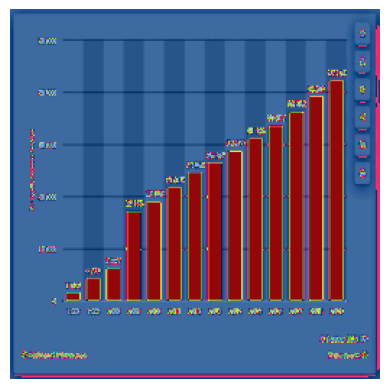

[REFERENCE] <num>, the annual per capita <unk> income of urban households in China amounted to approximately <num>,<num> <unk> <unk> per capita income in Chinese urban areas saw a significant rise over the last <unk> and is still rising at a high <unk> During the last nine years, per capita <unk>
[PREDICTED] statistic the the of of in in <unk> <unk> <unk> <unk> <unk> <unk> <num> <num> <num> <num> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk>



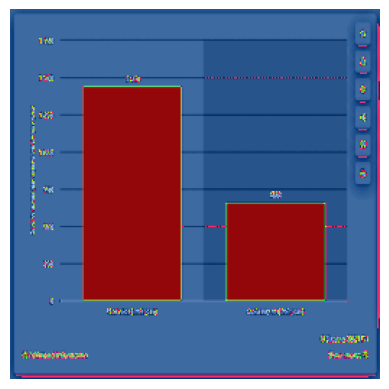

[REFERENCE] statistic presents a ranking of <unk> retail <unk> locations in <unk> based on the cost of rent as of June <num>. Of the <unk> <unk> <unk> in <unk> has the highest rental rate at <num>,<num> euros per square meter per year.
[PREDICTED] statistic shows the the of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



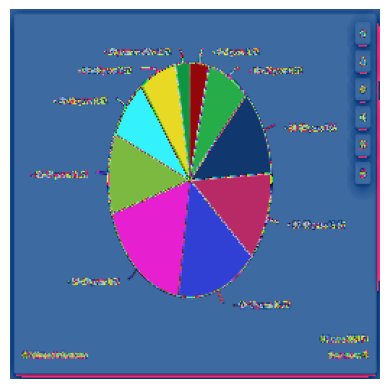

[REFERENCE] spread of the Coronavirus (COVID-<num>) in Italy has hit every age group in a more or less <unk> <unk> In fact, as the chart <unk> around one in two individuals infected with the virus was under <num> years old. At <unk> most of the cases recorded occurred among older
[PREDICTED] statistic shows the <unk> of <unk> <unk> <unk> in the <num> <num> the the <unk> of <num> <num> <unk> <unk> <unk> the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk>



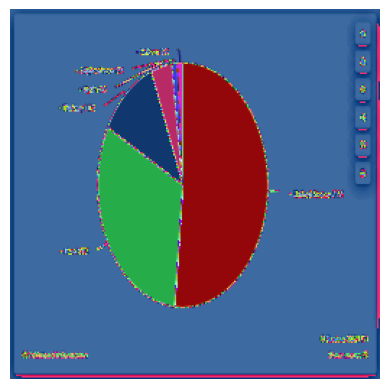

[REFERENCE] statistic shows the leading producers of <unk> worldwide, based on production share in <num>/<num>. In the <unk> year of <num>/<num>, the United States produced about <num> percent of the <unk> that were produced worldwide.
[PREDICTED] statistic shows the the of of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of the <unk> of <unk> <unk> <unk> <unk> <unk>



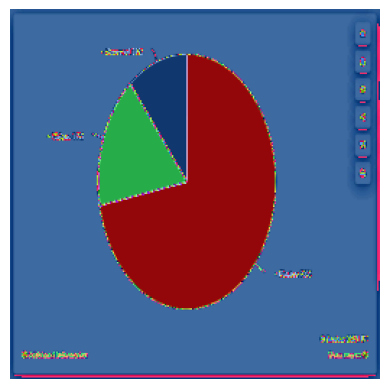

[REFERENCE] March <num>, <unk> the COVID-<num> <unk> <num> percent of <unk> on Instagram <unk> the disease or the <unk> <unk> in Latin America <unk> a single <unk> <unk> <num> percent of <unk> on the platform used a <unk> known as <unk> which <unk> a series of <unk> and/or <unk> to
[PREDICTED] statistic the the the the of of <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



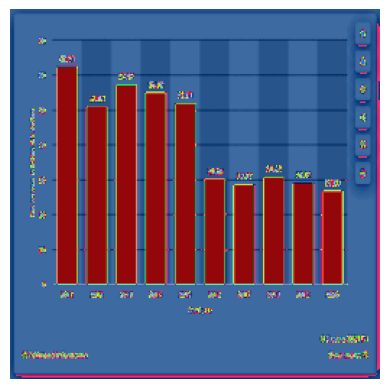

[REFERENCE] <num>, the <unk> <unk> <unk> <unk> brought in revenues of <num> billion U.S. dollars, a fall from the <num> billion U.S. dollars that the company recorded in the previous year. <unk> <unk> <unk> - additional information <unk> <unk> <unk> <unk> is an American <unk> <unk> formed on November <num>,
[PREDICTED] statistic the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of to of of of of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



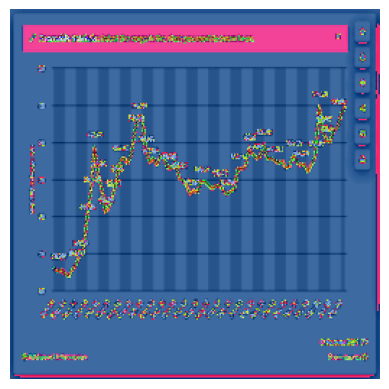

[REFERENCE] exchange rate of U.S. <unk> to Russian <unk> amounted to <num> on October <num>, <num>, which meant that one U.S. <unk> could buy approximately <num> Russian <unk> on that day. <unk> exchange rates <unk> information A <unk> exchange rate <unk> how much a given <unk> is worth in another
[PREDICTED] statistic shows the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



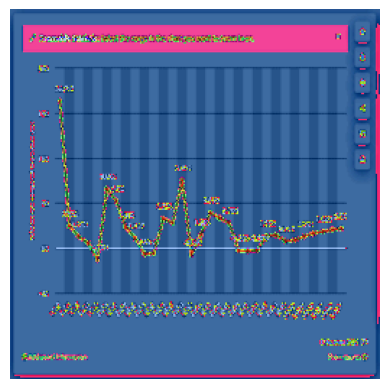

[REFERENCE] statistic shows the average inflation rate in North <unk> from <num> to <num>, with projections up until <num>. In <num>, the average inflation rate in North <unk> amounted to about <num> percent compared to the previous year.
[PREDICTED] statistic shows the the of of in <unk> <unk> in <unk> to of <unk> <unk> <num> <unk> the <unk> the the <unk> of <unk> <unk> <unk> <unk> <num> <unk> <num> <num> <unk> of the of <unk>



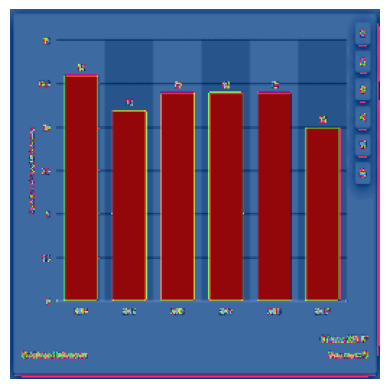

[REFERENCE] <num>, there were <num> establishments producing sports and equipment in <unk> two establishments less than a year earlier. In that same year, there were <num> employees in this sector.
[PREDICTED] statistic the the the the of the <unk> the <unk> the <unk> <unk> <unk> the the the of of <unk> the <unk> <unk> <unk> <unk> <unk> of the <unk> <unk>



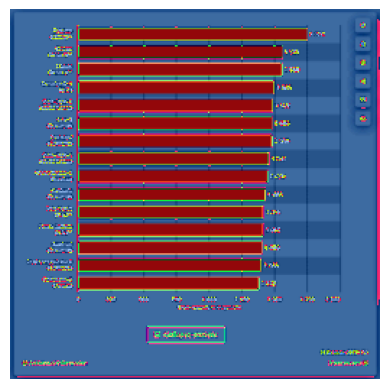

[REFERENCE] largest <unk> <unk> worldwide based on gross capacity was <unk> in China, with gross capacity of <num>,<num> <unk> as of December <num>, <num>. <unk> two out of three leading <unk> power <unk> were located in France. <unk> and <unk> had a gross capacity of <num>,<num> and <num>,<num> <unk> respectively.
[PREDICTED] statistic shows the the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



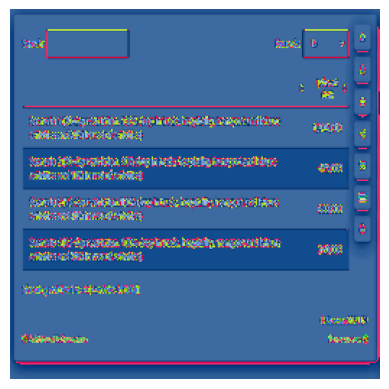

[REFERENCE] statistic presents the number of <unk> that could <unk> be <unk> by the coronavirus (COVID-<num>) pandemic in <unk> as projected in March <num> and based on different <unk> <unk> a <unk> <unk> nationwide <unk> with a drop in <unk> <unk> transport and leisure activities by <num> percent, the Spanish
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> of <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> of



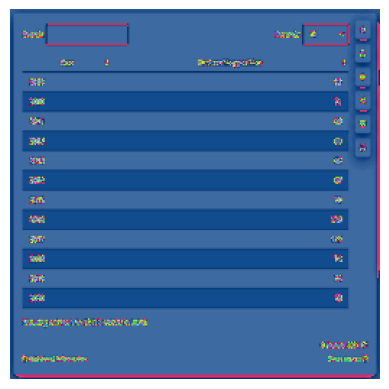

[REFERENCE] of March <num>, the <unk> women's soccer team ranked <num>rd in the FIFA world ranking, up from the <num>th position achieved the previous year.
[PREDICTED] statistic the <num>, the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> the to of <unk> <unk> the of <unk> the



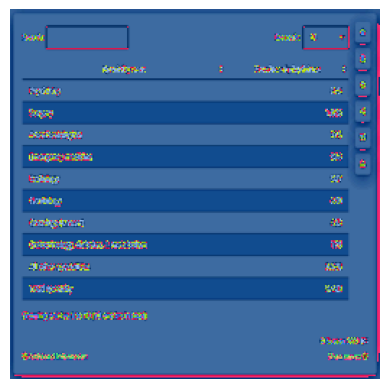

[REFERENCE] statistic depicts the number of active physicians in Minnesota as of March <num>, ordered by their specialty area. At that time, there were <num> anesthesiologists active in <unk> There are some <num>,<num> total active physicians in the state.
[PREDICTED] statistic shows the the of of <unk> in <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> the the <unk> the <unk> <num> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



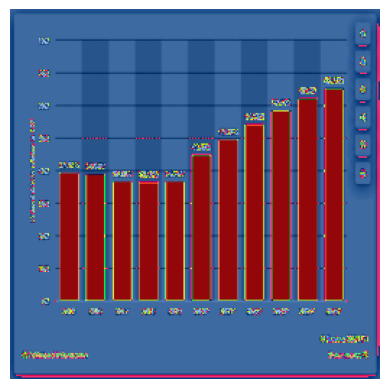

[REFERENCE] statistic shows the national debt of Romania from <num> to <num> in relation to the gross domestic product <unk> with projections up until <num>. The figures <unk> to the whole country and include the <unk> of the state, the <unk> the <unk> and the social <unk> In <num>, the
[PREDICTED] statistic shows the the of of of <unk> <unk> to of <unk> of <num>, the <num> of of <unk> the <unk> <unk> <unk> the <unk> the <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> of <unk> <unk> of <unk> <unk> the <unk>



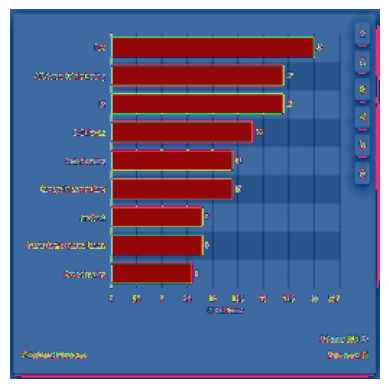

[REFERENCE] statistic presents the leading financial <unk> firms (including investment <unk> to merger and acquisition deals in Norway in <num>, ranked by deal <unk> In that time, <unk> emerged as the leading <unk> to M&A deals in <unk> with a transaction <unk> of <num> deals in <num>.
[PREDICTED] statistic shows the the of of of <unk> the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <num> <num> <num> <unk> the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk>



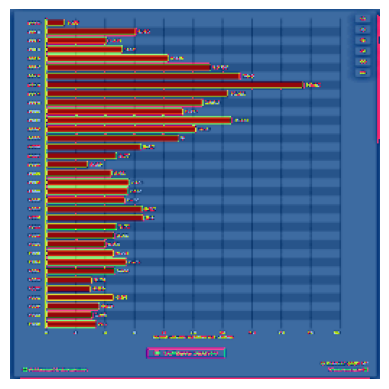

[REFERENCE] graph shows the growth in the U.S. export volume of trade goods to <unk> from <num> to <num>. In <num>, U.S. exports to <unk> amounted to <num> billion U.S. dollars.
[PREDICTED] statistic shows the the of of <unk> of in in <unk> <unk> <unk> <unk> <unk> <unk> to of <unk> <num>, the <unk> <unk> <unk> <unk> <unk> <unk> <unk> of



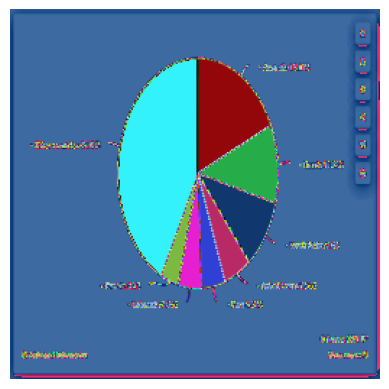

[REFERENCE] statistic shows the distribution of gold reserves worldwide in <num>, by selected country. In that year, Australia had the world's largest gold <unk> with a share of <num> percent of the total gold reserves worldwide.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the the the <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk>



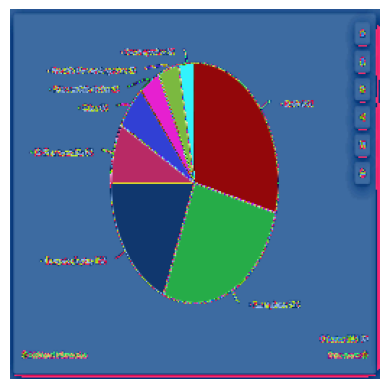

[REFERENCE] to a global study held in <num>, internet users spent <num> percent of their music listening time on their <unk> but most time listening to music was <unk> via <unk> <unk> more time was spent listening to music on a <unk> or <unk> <unk> <unk> than via a smart
[PREDICTED] statistic the the of the the the <unk> <unk> <unk> <unk> the of the <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



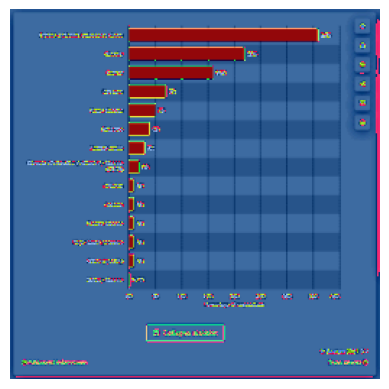

[REFERENCE] survey displays the share of people in West <unk> about what they <unk> is the most important health issue faced in their state, as of September <num>. As much as <num> percent of the survey respondents believe that <unk> <unk> <unk> is the most important health issue being faced
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



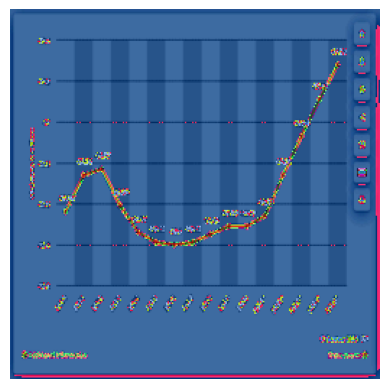

[REFERENCE] statistic shows the total population of Spain from <num> to <num>, with projections up until <num>. In <num>, the total population of Spain was around <num> million people. Population of Spain While <unk> fertility rate has been relatively steady over the past <unk> its <unk> population growth has been
[PREDICTED] statistic shows the the of of the <unk> <unk> to of <unk> <unk> <unk> <unk> the <unk> the the <unk> of of <unk> <unk> <unk> <unk> <unk> of <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



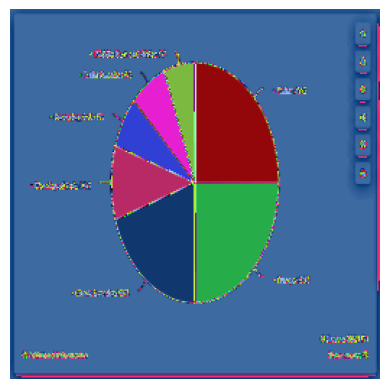

[REFERENCE] in China, Europe, and North America are forecast to account for <num> percent of the global market share of <unk> consumer goods in <num>. China's share of <num> percent is forecast to be <unk> than the combined share of <num> percent for all other countries in developed and emerging
[PREDICTED] statistic shows the the the <unk> the the the the <unk> <unk> <unk> of the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk>



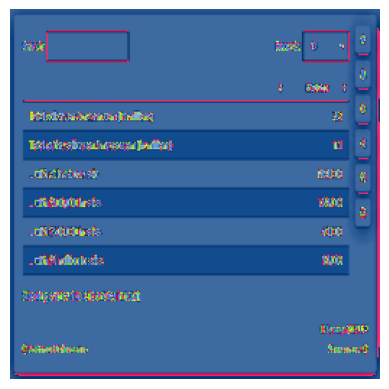

[REFERENCE] <num>, there were <num> million active <unk> from the United States <unk> goods via <unk> Approximately a third of those <unk> had at least one sale during the measured period, and <num>,<num> <unk> generated at least <num>,<num> U.S. dollars in <unk> <unk> sales.
[PREDICTED] statistic the the the the of in <unk> <unk> to of in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



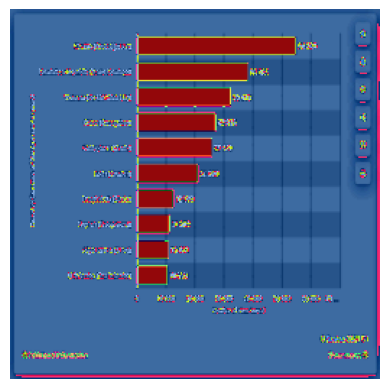

[REFERENCE] statistic shows the leading international <unk> that issued United States <unk> <unk> in the fiscal year of <num>. The most <unk> <unk> in the fiscal year of <num> were <unk> in Mexico, <unk> <unk> with <num>,<num> total <unk>
[PREDICTED] statistic shows the the of of the <unk> the <unk> in <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <num>, <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



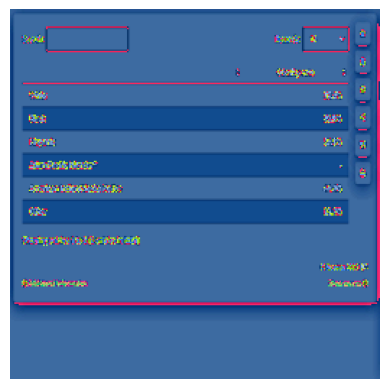

[REFERENCE] statistic depicts the obesity rates for adults in <unk> in <num>, by ethnicity. In that year, <num> percent of all white adults in <unk> were obese. <unk> <unk> that could lead to being overweight and obese is often <unk> due to a lack of <unk> <unk> <unk> such as
[PREDICTED] statistic shows the the of of <unk> <unk> in in <unk> <unk> <unk> <unk> <unk> the the <num> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



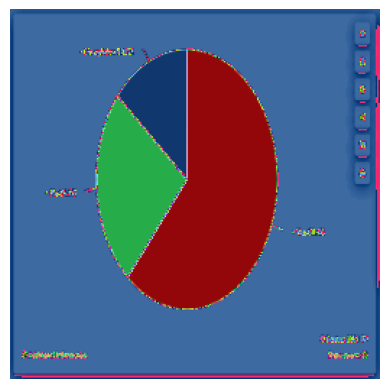

[REFERENCE] case of coronavirus (COVID-<num>) was confirmed in Poland as of February <num>, <num>. Nevertheless, more than <num> percent of the society <unk> that Poland is not prepared for a possible virus <unk>
[PREDICTED] statistic the the <unk> the <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> the the the the of the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



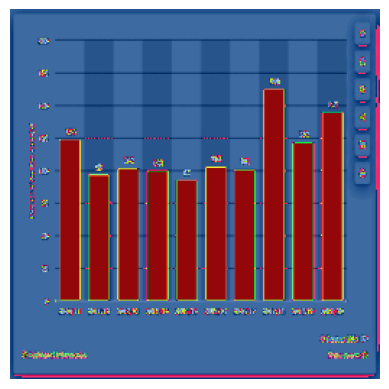

[REFERENCE] <num> <unk> recorded by the London Metropolitan <unk> in <num>/<num> occurred following an <num> percent increase from the previous year, when there were <num> <unk> <unk> Although this as still <unk> than the <num> recorded in <num>/<num>, it was far higher than in any year between <num>/<num> and <num>/<num>,
[PREDICTED] statistic shows of the the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> the <unk> of the the to of <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk>



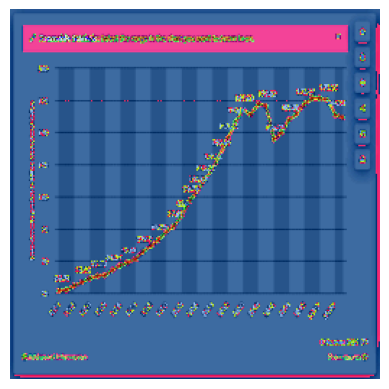

[REFERENCE] statistic shows gross domestic product (GDP) in <unk> from <num> to <num>. Gross domestic product (GDP) denotes the aggregate value of all services and goods produced within a country in any given year. GDP is an important indicator of a country's economic power. In <num>, <unk> estimated gross domestic
[PREDICTED] statistic shows the the the of the the in <unk> to of <unk> <num>, <num>, the the the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk>



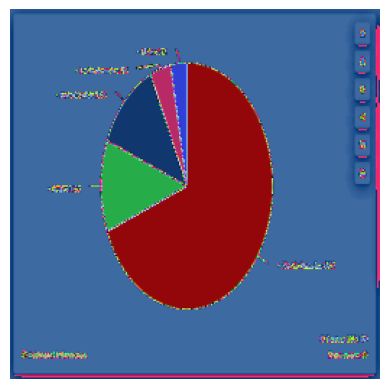

[REFERENCE] <unk> company Under Armour generated <num> percent of their net revenues from its home region of North America in <num>. The revenue share from the <unk> region was twelve percent that year. <unk> is the <unk> market <unk> other <unk> The total net revenue of Under Armour has increased
[PREDICTED] statistic the the <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> to <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> the the to of <unk> <unk> <unk> <unk> the the the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



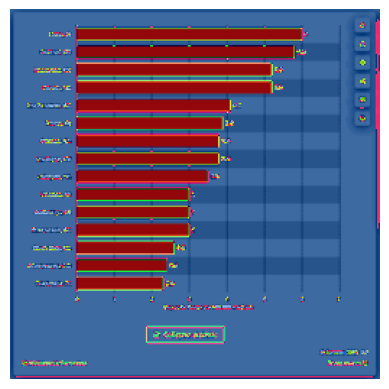

[REFERENCE] statistic shows the cities with the largest number of <unk> dog parks per <num>,<num> residents in the United States in <num>. The city of <unk> had <num> <unk> dog parks per <num>,<num> residents in <num>.
[PREDICTED] statistic shows the the of of in of in in <unk> <unk> <unk> <unk> the in <unk> <unk> of in <num> <num> the the <unk> <unk> <unk> of <unk> <unk> <unk>



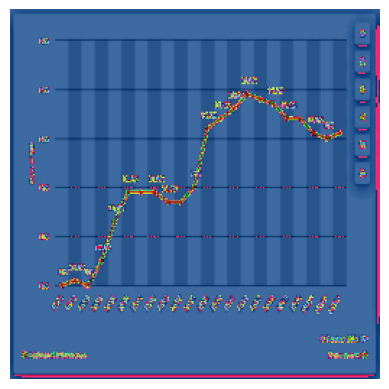

[REFERENCE] <num>, the total health expenditure made up around <num> percent of total GDP in the Netherlands. This is <unk> due to the health insurance system. In the <unk> every resident or <unk> is <unk> to take a basic health insurance to <unk> medical costs <unk> for example, visits to
[PREDICTED] statistic the the of of of <unk> the the the of the <unk> <unk> <unk> <unk> of <unk> <unk> the <unk> <unk> <unk> of <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



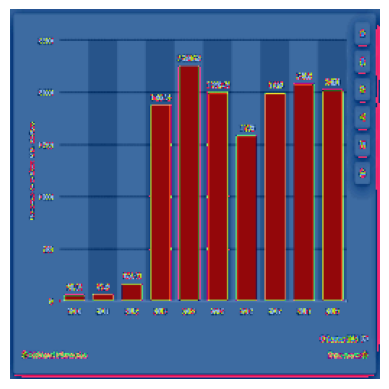

[REFERENCE] in Sweden in <num>, <unk> is a video game <unk> that is most famous for its <unk> gaming <unk> <unk> <unk> <unk> The <unk> revenue reached <num> billion U.S. dollars in <num>, a marked increase from revenue of less than <num> million U.S. dollars in <num>. <unk> of the
[PREDICTED] statistic the the the <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> to the <unk> <unk> <unk> of <unk>



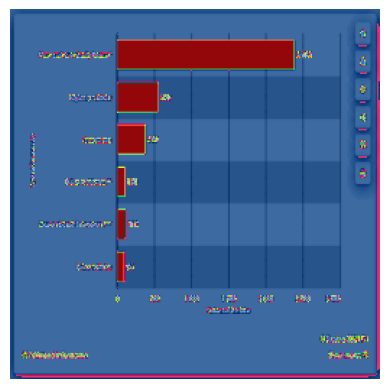

[REFERENCE] <num>, <unk> in <unk> and <unk> <unk> accounted for <num>,<num> fatalities in the United States. On the other hand, about <num> <unk> died in <unk> <unk>
[PREDICTED] statistic the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk>



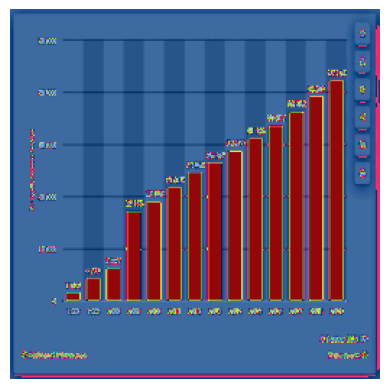

[REFERENCE] <num>, the annual per capita <unk> income of urban households in China amounted to approximately <num>,<num> <unk> <unk> per capita income in Chinese urban areas saw a significant rise over the last <unk> and is still rising at a high <unk> During the last nine years, per capita <unk>
[PREDICTED] statistic the the of of in in <unk> <unk> <unk> <unk> <unk> <unk> <num> <num> <num> <num> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk>



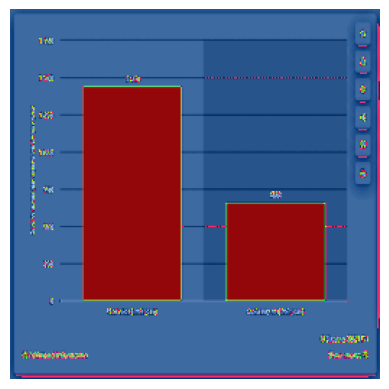

[REFERENCE] statistic presents a ranking of <unk> retail <unk> locations in <unk> based on the cost of rent as of June <num>. Of the <unk> <unk> <unk> in <unk> has the highest rental rate at <num>,<num> euros per square meter per year.
[PREDICTED] statistic shows the the of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



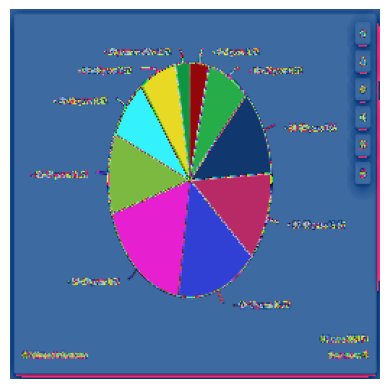

[REFERENCE] spread of the Coronavirus (COVID-<num>) in Italy has hit every age group in a more or less <unk> <unk> In fact, as the chart <unk> around one in two individuals infected with the virus was under <num> years old. At <unk> most of the cases recorded occurred among older
[PREDICTED] statistic shows the <unk> of <unk> <unk> <unk> in the <num> <num> the the <unk> of <num> <num> <unk> <unk> <unk> the <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk>



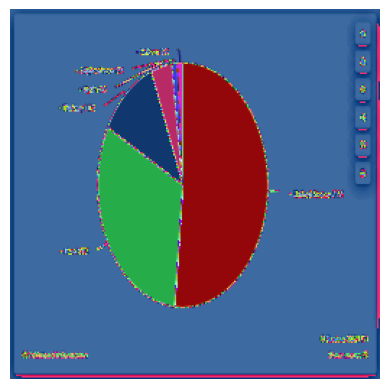

[REFERENCE] statistic shows the leading producers of <unk> worldwide, based on production share in <num>/<num>. In the <unk> year of <num>/<num>, the United States produced about <num> percent of the <unk> that were produced worldwide.
[PREDICTED] statistic shows the the of of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> of the <unk> of <unk> <unk> <unk> <unk> <unk>



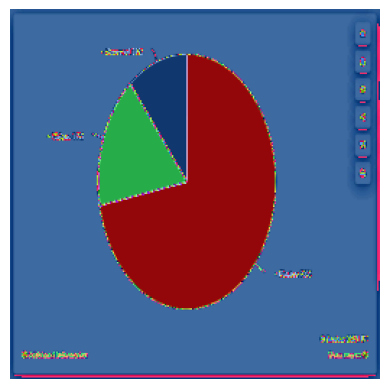

[REFERENCE] March <num>, <unk> the COVID-<num> <unk> <num> percent of <unk> on Instagram <unk> the disease or the <unk> <unk> in Latin America <unk> a single <unk> <unk> <num> percent of <unk> on the platform used a <unk> known as <unk> which <unk> a series of <unk> and/or <unk> to
[PREDICTED] statistic the the the the of of <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



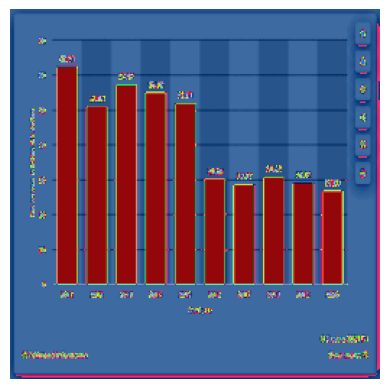

[REFERENCE] <num>, the <unk> <unk> <unk> <unk> brought in revenues of <num> billion U.S. dollars, a fall from the <num> billion U.S. dollars that the company recorded in the previous year. <unk> <unk> <unk> - additional information <unk> <unk> <unk> <unk> is an American <unk> <unk> formed on November <num>,
[PREDICTED] statistic the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of to of of of of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



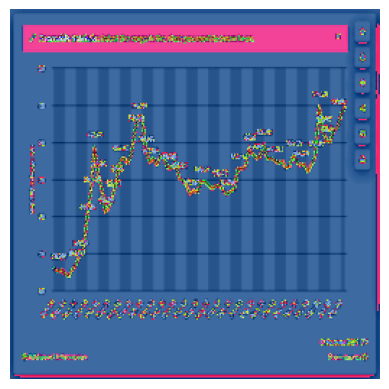

[REFERENCE] exchange rate of U.S. <unk> to Russian <unk> amounted to <num> on October <num>, <num>, which meant that one U.S. <unk> could buy approximately <num> Russian <unk> on that day. <unk> exchange rates <unk> information A <unk> exchange rate <unk> how much a given <unk> is worth in another
[PREDICTED] statistic shows the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



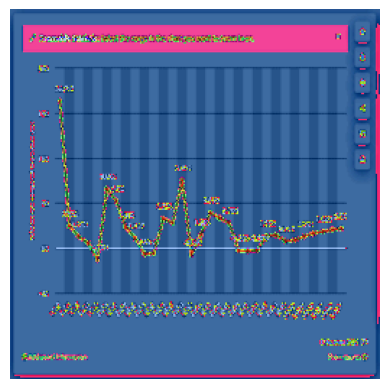

[REFERENCE] statistic shows the average inflation rate in North <unk> from <num> to <num>, with projections up until <num>. In <num>, the average inflation rate in North <unk> amounted to about <num> percent compared to the previous year.
[PREDICTED] statistic shows the the of of in <unk> <unk> in <unk> to of <unk> <unk> <num> <unk> the <unk> the the <unk> of <unk> <unk> <unk> <unk> <num> <unk> <num> <num> <unk> of the of <unk>



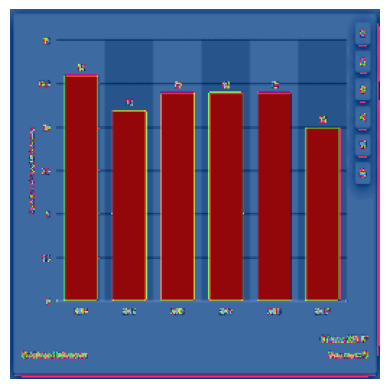

[REFERENCE] <num>, there were <num> establishments producing sports and equipment in <unk> two establishments less than a year earlier. In that same year, there were <num> employees in this sector.
[PREDICTED] statistic the the the the of the <unk> the <unk> the <unk> <unk> <unk> the the the of of <unk> the <unk> <unk> <unk> <unk> <unk> of the <unk> <unk>



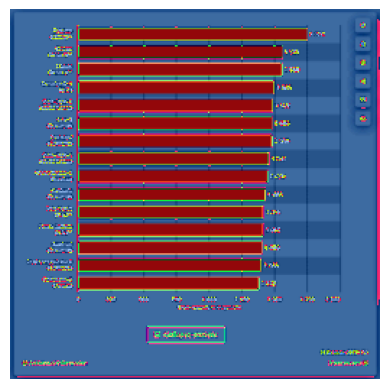

[REFERENCE] largest <unk> <unk> worldwide based on gross capacity was <unk> in China, with gross capacity of <num>,<num> <unk> as of December <num>, <num>. <unk> two out of three leading <unk> power <unk> were located in France. <unk> and <unk> had a gross capacity of <num>,<num> and <num>,<num> <unk> respectively.
[PREDICTED] statistic shows the the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



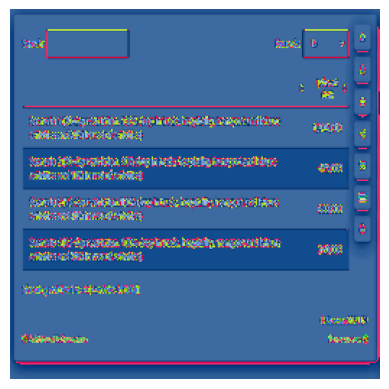

[REFERENCE] statistic presents the number of <unk> that could <unk> be <unk> by the coronavirus (COVID-<num>) pandemic in <unk> as projected in March <num> and based on different <unk> <unk> a <unk> <unk> nationwide <unk> with a drop in <unk> <unk> transport and leisure activities by <num> percent, the Spanish
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> of <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> of



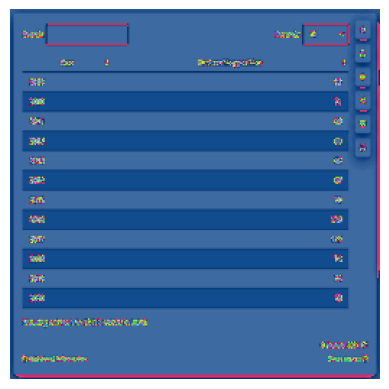

[REFERENCE] of March <num>, the <unk> women's soccer team ranked <num>rd in the FIFA world ranking, up from the <num>th position achieved the previous year.
[PREDICTED] statistic the <num>, the the of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> the to of <unk> <unk> the of <unk> the



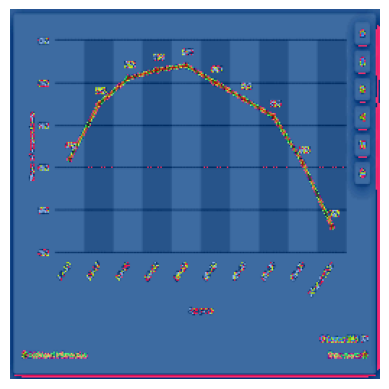

[REFERENCE] statistic shows the percentage of American men who <unk> alone during last year in <num>, sorted by age group. The <unk> were published in the <unk> of <unk> <unk> a <unk> on <unk> <unk> in the United States. <num> percent of respondents aged <num> to <num> stated they <unk>
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> of <unk> of



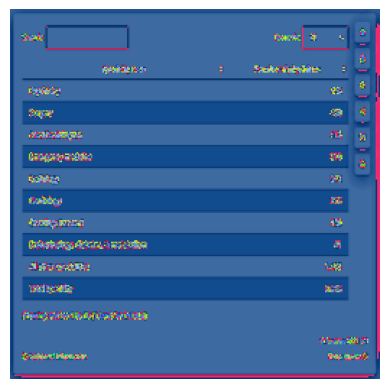

[REFERENCE] statistic depicts the number of active physicians in <unk> as of March <num>, sorted by their specialty area. At that time, there were <num> anesthesiologists active in <unk> In the state, there were over <num>,<num> active physicians in total.
[PREDICTED] statistic shows the the of of <unk> in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> the of <unk> <unk> <unk> <unk> <unk> <unk>



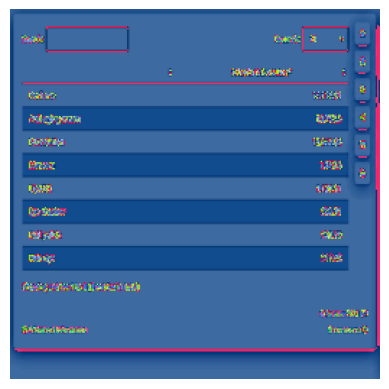

[REFERENCE] statistic presents a list of the average prices of <unk> and beauty products in <unk> as of May <num>. As of that point in time, the average price for a <unk> in the South American country amounted to over <num> thousand U.S. dollars.
[PREDICTED] statistic shows the the of of <unk> of in in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <num> of <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of



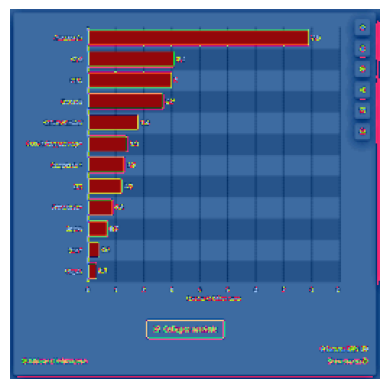

[REFERENCE] statistic shows a ranking of key clothing retailers in Germany, by revenue in <num>. According to source <unk> earned the highest revenue of the given clothing retailers that year, amounting to almost <num> billion euros. <unk> ranked second, with revenues of approximately <num> billion euros.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <num>, the the the the <unk> of <unk> the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of of the <unk> <unk> of



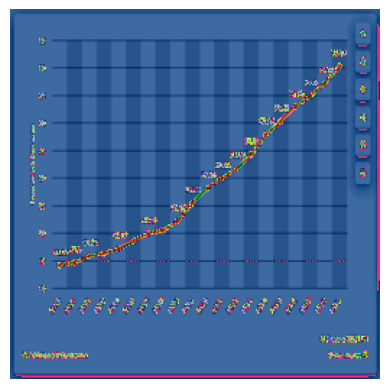

[REFERENCE] statistic shows <unk> health insurance spending on hospital <unk> in Germany from <num> to <num>. In <num>, <unk> health insurance covered <num> billion euros worth of hospital <unk> compared to <num> billion euros in the previous year.
[PREDICTED] statistic shows the the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> to <num>. <unk> <num>, the <unk> <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> of



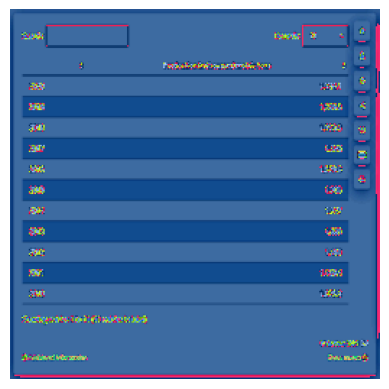

[REFERENCE] statistic depicts <unk> production of copper from <num> to <num>. In <num>, <unk> produced some <num> million metric tons of <unk>
[PREDICTED] statistic shows the the the the <unk> <unk> to of <unk> <num>, the <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk>



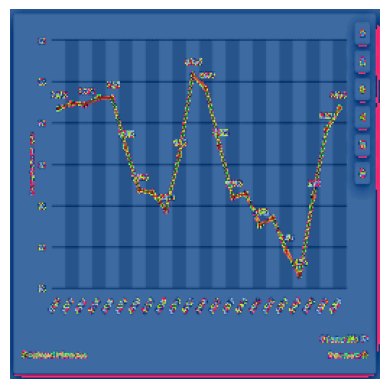

[REFERENCE] statistic shows the unemployment rate in Nicaragua from <num> to <num>. In <num>, the unemployment rate in Nicaragua was at approximately <num> percent.
[PREDICTED] statistic shows the the of of <unk> in <unk> to of <unk> <num>, the the of <unk> <unk> <unk> <num> <num> <num> of



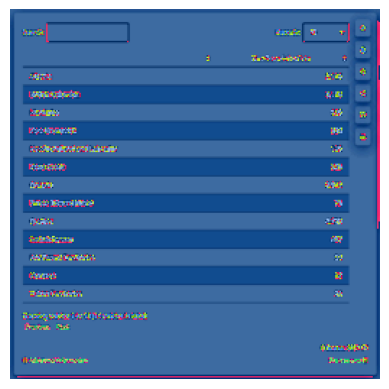

[REFERENCE] statistic shows the number of <unk> <unk> in Canada as of January <num>, by <unk> As of that time, there were about <num> thousand <unk> in Canada in total, of which almost nine thousand were <unk> in <unk>
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



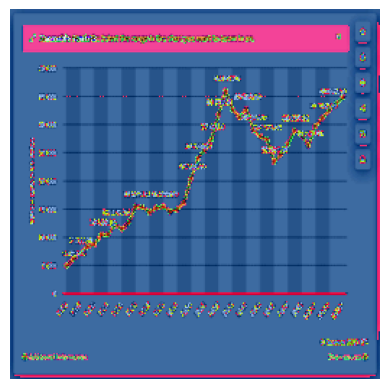

[REFERENCE] statistic shows gross domestic product (GDP) per capita in <unk> from <num> to <num>, with projections up to <num>. GDP is the total value of all goods and services produced in a country in a year. It is considered to be a very important indicator of the economic strength
[PREDICTED] statistic shows the the the of the the in in in <unk> to <num>. <unk> <unk> <num> <unk> the <unk> <num>, the the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> of <num> <num> the the <unk> <unk> of <unk> of the <unk> of <unk>



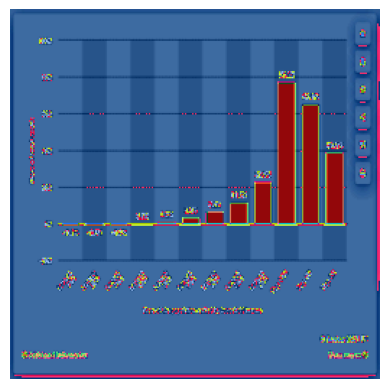

[REFERENCE] <num>, <num> percent of the total wealth in the United States was owned by the top <num> percent of <unk> In comparison, the lowest <num> percent of <unk> only owned <num> percent of the total <unk> <unk> <unk> in the U.S. Despite the <unk> that the United States is
[PREDICTED] statistic the the of the <unk> of <unk> <unk> <unk> of in <unk> <unk> <unk> <unk> of <unk> of the <unk> <unk> the <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> of <unk> <unk>



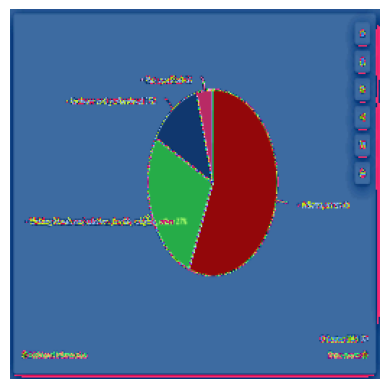

[REFERENCE] statistic shows international <unk> tourism by <unk> of visit in <num>. <unk> or <unk> travel <unk> the largest share of <unk> tourism in <num> with <num> percent. <unk> percent of <unk> tourism did not have a <unk> <unk>
[PREDICTED] statistic shows the the the the the <unk> <unk> <unk> <unk> <unk> <num>, <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



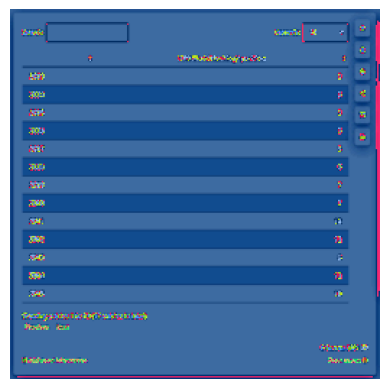

[REFERENCE] statistic shows the FIFA World Ranking of the Norwegian women's national football team from <num> to <num>. From <num> to <num>, the position remained the same (<num>) and was also the highest rank the team ever <unk> Rank <num> was the lowest result of <unk> women's national team, which
[PREDICTED] statistic shows the the of of of the <unk> of in in in <unk> <unk> to of <unk> <num>, the of <unk> <unk> of of <unk> of of <unk> <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> <unk> of <unk> of of <unk> <unk> <unk> <unk> <unk> <unk>



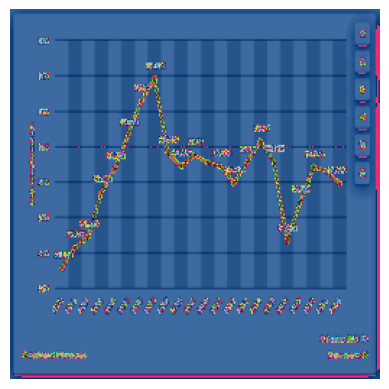

[REFERENCE] statistic shows the youth unemployment rate in Saudi <unk> from <num> and <num>. According to the source, the data are ILO estimates. In <num>, the estimated youth unemployment rate in Saudi <unk> was at <num> percent.
[PREDICTED] statistic shows the the of of in <unk> in in <unk> to of <unk> <num>, the the of <unk> of of the <unk> <unk> the <unk> of of <unk> <unk> <unk> <unk> <unk> <num> of



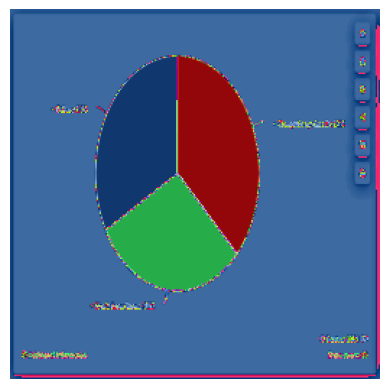

[REFERENCE] to a survey conducted to understand the impact of the coronavirus (COVID-<num>) in Indian <unk> about <num> percent of organizations have implemented <unk> <unk> in their work place as a safety <unk> Survey respondents included members <unk> to Indian private and public corporate <unk> and multinational companies. For further
[PREDICTED] statistic the the of the the <unk> <unk> of <unk> <unk> of in <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



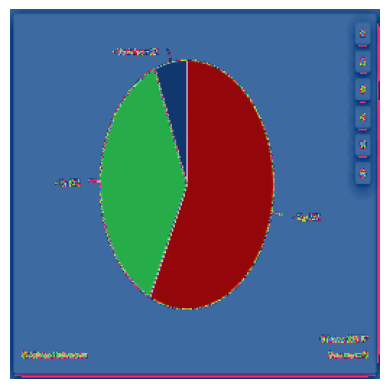

[REFERENCE] a survey of <num>, most Italian respondents believed that the <unk> <unk> by young leaders could have an impact on the political measures of the EU to fight climate <unk> A similar survey about <unk> for <unk> shows that Italian interviewees thought that the movement of young students had
[PREDICTED] statistic the of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk>



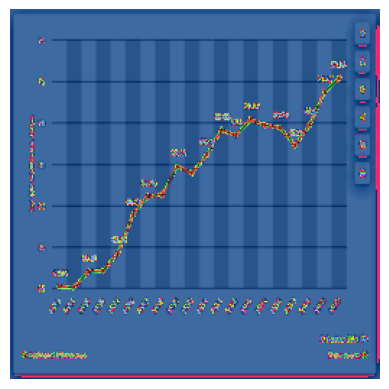

[REFERENCE] statistic shows the development of West <unk> real GDP from <num> to <num>. In <num>, the real GDP of West <unk> was <num> billion U.S. dollars.
[PREDICTED] statistic shows the the of of <unk> <unk> <unk> <unk> <unk> to of <unk> <num>, the <unk> of <unk> <unk> <unk> <unk> <unk> <unk> of <unk>



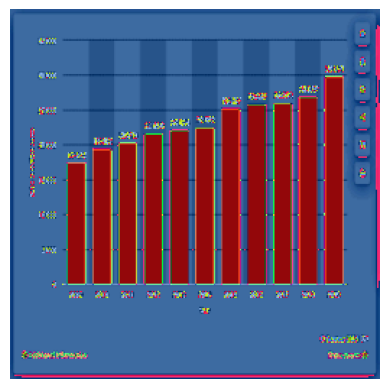

[REFERENCE] <num> and <num>, the <unk> Group increased its <unk> sales by approximately <num> billion U.S. dollars worldwide. After years of constant <unk> the company <unk> to generate close to <num> billion U.S. dollars in global sales in <num>. <unk> of <unk> <unk> sales by product <unk> <unk> numerous brands
[PREDICTED] statistic the of the of of <unk> <unk> <unk> <unk> <unk> the <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



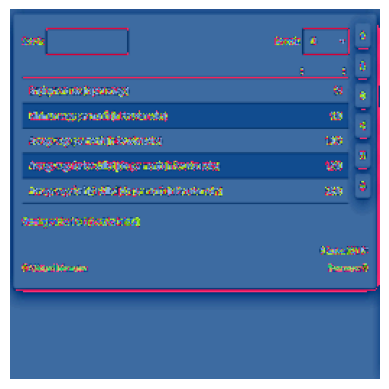

[REFERENCE] table presents the key figures on the labor market in <unk> as of December <num>. <unk> employment rate amounted to nearly <num> percent. The <unk> wage in the country was estimated at <num> <unk> <unk> per month.
[PREDICTED] statistic shows the the of of <unk> <unk> of <unk> in in <unk> <unk> <unk> <unk> <num>, the <unk> <unk> <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> <unk>



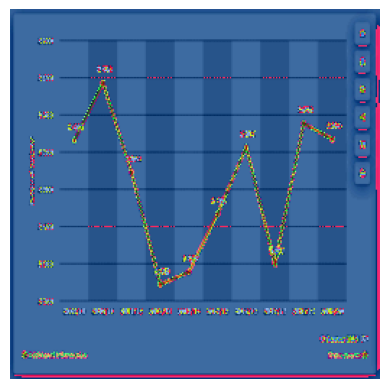

[REFERENCE] on the number of <unk> <unk> recorded by the police per year in <unk> from April <num> to October <num> shows that after the number of <unk> peaked in the fiscal year of <num>/<num>, figures dropped in the following years. In <num> <unk> there were <num>,<num> reported cases, more
[PREDICTED] statistic the the of of <unk> <unk> <unk> <unk> <unk> of <unk> in <unk> <unk> <unk> to <unk> of <unk> <unk> of of the <unk> of of <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <num> the of <unk> <unk> <unk> <unk>



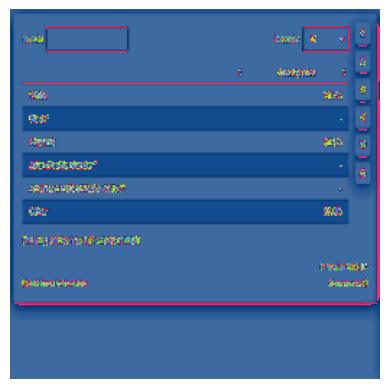

[REFERENCE] statistic depicts the obesity rates for adults in <unk> in <num> by ethnicity. As of that year, around <num> percent of all white adults in <unk> were obese.
[PREDICTED] statistic shows the the of of <unk> <unk> in in <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



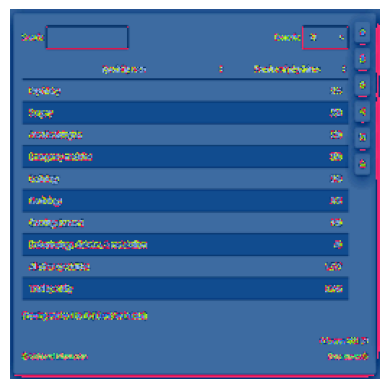

[REFERENCE] statistic depicts the number of active physicians in Arkansas as of March <num>, ordered by their specialty area. At that time, there were <num> anesthesiologists active in <unk> There are over <num>,<num> active physicians in <unk>
[PREDICTED] statistic shows the the of of <unk> in <unk> <unk> in <unk> <unk> <unk> <unk> the <unk> <unk> the the <unk> the <unk> <num> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



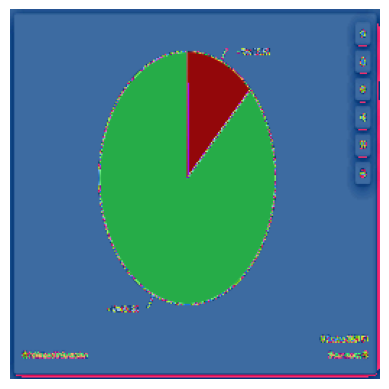

[REFERENCE] to a survey conducted from <num> to <num>, nearly <num> percent of Italians respondents know a <unk> of <unk> <unk> <unk> <unk> is the <unk> of sharing private <unk> <unk> or <unk> of a person without <unk> <unk> usually in an <unk> to <unk> or <unk> <unk> or <unk>
[PREDICTED] statistic the the of the the to of <unk> <unk> the of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



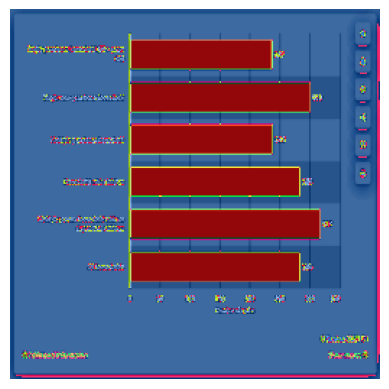

[REFERENCE] statistic shows the average annual number of <unk> <unk> <unk> in households in England in <num>. <unk> <unk> households showed <num> <unk> on average per year, while multiple person households with no <unk> children showed <num>.
[PREDICTED] statistic shows the the of of in in <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <num> <num>, <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



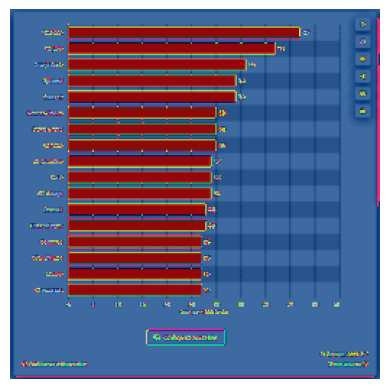

[REFERENCE] statistic depicts the countries with the highest <unk> rates worldwide in <num>. In that year, <unk> was the country with the highest <unk> rate worldwide.
[PREDICTED] statistic shows the the of of <unk> of of <unk> <unk> in <unk> <num>, the the <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> <unk>



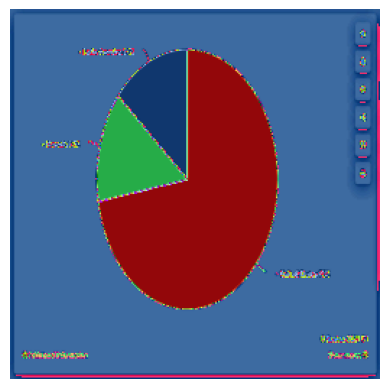

[REFERENCE] statistic <unk> the sales share of Hugo Boss in the <unk> in <num>, by country. In <num>, <num> percent of Hugo <unk> sales in the <unk> were generated in the United States. In that year, Hugo Boss generated sales of <num> million euros in the <unk>
[PREDICTED] statistic shows the the of the the <unk> <unk> <unk> <unk> of <unk> <unk> <num> <unk> <num> the <num> of the <unk> <unk> <unk> the <unk> of <unk> <unk> <unk> of <unk> <unk> <unk> the <unk> of



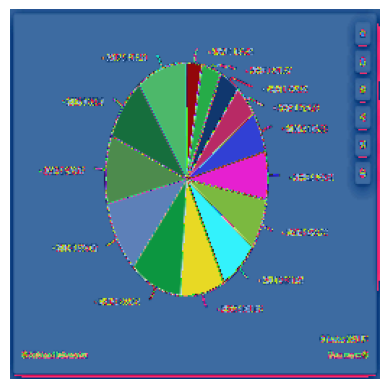

[REFERENCE] statistic illustrates the total money <unk> in road transport <unk> in Norway from <num> to <num>, in million euros. In the period of consideration, road transport <unk> investments <unk> In <num>, investments in road <unk> amounted to nearly <num> billion euros. The largest amount of investments in road transport
[PREDICTED] statistic shows the the of of of <unk> <unk> in <unk> <unk> <unk> <unk> to of In <unk> <unk> <num> <num> the of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <num> <unk> <unk> <unk> of <unk> <unk>



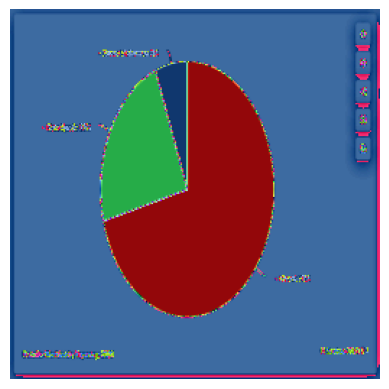

[REFERENCE] fiscal year <num>, <unk> <unk> brand accounted for a <num> percent share of <unk> <unk> net sales. <unk> Inc. had global net sales of approximately <num> billion U.S. dollars that year. <unk> Inc. <unk> of the <unk> <unk> <unk> and <unk> <unk> <unk> <unk>
[PREDICTED] statistic the the the of <unk> <unk> <unk> <unk> <unk> of of the the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



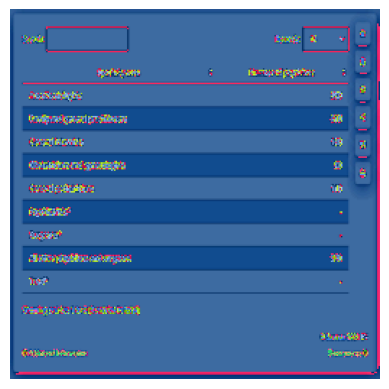

[REFERENCE] statistic depicts the number of employed physicians in Puerto Rico as at May <num>, ordered by specialty area. At that time, there were around <num> general <unk> employed in Puerto <unk>
[PREDICTED] statistic shows the the of of <unk> in in <unk> <unk> <unk> <unk> <unk> the <unk> the <unk> the of <num> the <num> <num> <unk> <unk> of <unk> <unk> <unk> <unk> <unk>



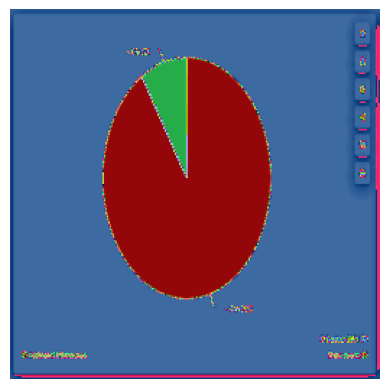

[REFERENCE] to a survey carried out in Mexico in March <num>, <num> percent of respondents who had <unk> holiday plans had <unk> or were <unk> to <unk> their <unk> due to the COVID-<num> outbreak. Only nine percent of the potential travelers surveyed were willing to <unk> on with their holiday
[PREDICTED] statistic the the of the the the <unk> <unk> United <num> <num> of the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



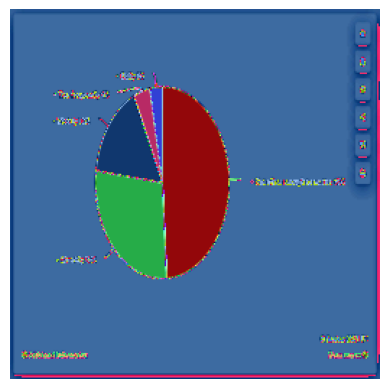

[REFERENCE] half of the respondents working with <unk> <unk> <unk> <unk> felt that their <unk> did not <unk> or change often <unk> to <unk> according to a <num> state of the <unk> <unk> Another <num> percent of respondents said that the <unk> in their companies <unk> or <unk> on a
[PREDICTED] statistic the the <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> of <unk> <unk> of <unk> <unk> <unk> of the <unk> <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>



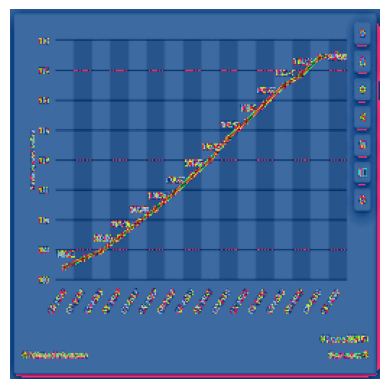

[REFERENCE] statistic illustrates the <unk> of the quarterly index of rents for <unk> activities in France from the <unk> quarter of <num> to the <unk> quarter of <num>. In the <unk> quarter of <num>, the rent index of the French <unk> activities was <num>.
[PREDICTED] statistic shows the the of <unk> <unk> of <unk> <unk> <unk> <unk> <unk> <unk> the <unk> <unk> to of <unk> <unk> <unk> of <unk> of <unk> <unk> <unk> <num>, the of <unk> <unk> <unk> <unk> of of <unk> <unk> of <unk> <unk> <unk> <unk>



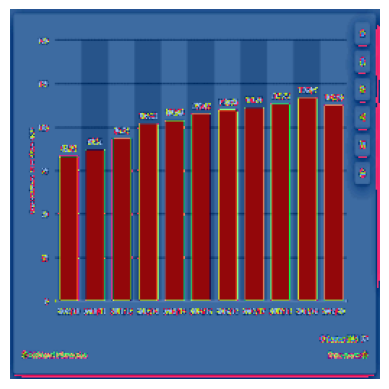

[REFERENCE] government of the United Kingdom spent approximately <num> billion British pounds on <unk> in <num>/<num>, compared with <num> billion in the previous financial year, which was the peak for <unk> spending in this ten year time period.
[PREDICTED] statistic shows the <unk> of <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk> <unk> <unk> the <unk> of of of of <unk> <unk> <unk> <unk> of of <unk> <unk> <unk> <unk>



In [30]:
# Evaluate the generated captions against reference captions
generate_and_compare_captions(chart_caption_model, test_dataloader, vocab, num_samples=5)


### Summary of Model Version 1: Chart-to-Text Generation

---

#### **Project Overview**

The goal of this project is to create a deep learning pipeline that takes **chart images** as input and generates meaningful **textual descriptions** summarizing the content of those charts. This helps make visual data more accessible and understandable, particularly for users who may rely on screen readers or prefer text descriptions.

#### **Dataset**

- **Images**: The dataset consists of various types of charts, including **bar charts**, **line charts**, **pie charts**, **tables**, and **column charts**.
- **Metadata**:
  - **Captions**: Provided as reference text for each chart.
  - **x-axis and y-axis labels**: Text information related to the axes of the charts.
  - The images are stored in a directory structure, and metadata is provided in a CSV file.

#### **Model Architecture**

##### **Encoder - CNN (ResNet-50)**

- The encoder uses a **pre-trained ResNet-50** model.
- It extracts **visual features** from each chart image.
- The last fully connected layer of the ResNet is replaced by a linear projection to match the **embedding size** required for the decoder.
- Currently, the **encoder** is **frozen** and not fine-tuned during training, meaning it uses pre-trained weights without further updates.

##### **Decoder - RNN (LSTM)**

- The decoder is an **LSTM-based sequence generator**.
- It takes the **visual feature vector** produced by the encoder and generates a **caption** describing the chart.
- **Tokenized captions**, along with their **axis labels**, are used to create input-output pairs for training the decoder.
- During training, the model learns to generate captions that align with the reference text in the dataset.

##### **Training and Inference**

- **Training**:
  - **CrossEntropyLoss** is used as the loss function.
  - **Adam optimizer** is used to update weights.
  - The training loop includes **teacher forcing**, where the ground truth caption tokens are provided as input to the LSTM.
  - The model was trained for **10 epochs** with a learning rate of **1e-4**.
  - Training data includes **image-caption pairs**, with the caption tokenized and padded to a **maximum length**.
  
- **Inference**:
  - **Greedy decoding** is currently used, which selects the token with the highest probability at each time step.
  - The model outputs a sequence of tokens, which are converted back to words using a reverse vocabulary lookup.

##### **Evaluation**

- The model was evaluated using the **BLEU score**.
- The **average BLEU score** on the test set was **0.1873**.
- The evaluation revealed several issues, including:
  - **High use of `<unk>` tokens**, indicating that the model struggled to generate specific words.
  - **Incoherent captions** with repetitive and meaningless phrases.
  - **Missing key entities** and poor representation of details in the generated captions.

##### **Debugging and Analysis**

- During qualitative analysis, it was observed that the model was:
  - **Struggling with vocabulary**, resulting in `<unk>` tokens frequently appearing in generated captions.
  - **Missing important details** from the charts, such as specific numbers, entities, and relationships.
  - **Failing to generate coherent captions** with context, often producing repetitive or incoherent output.
  
- The identified shortcomings pointed towards the need for better **attention mechanisms**, **improved vocabulary coverage**, and more **sophisticated decoding** during inference.

### Current Limitations of Version 1

1. **Lack of Attention Mechanism**:
   - The decoder does not have an **attention layer** to help focus on different parts of the chart during the caption generation process.
   - This likely contributes to the missing key information and lack of specific details.

2. **High Use of `<unk>` Tokens**:
   - The model often outputs `<unk>` tokens, indicating that it has difficulty representing certain words.
   - This suggests that the **vocabulary size** or coverage may not be adequate, or the model is over-relying on `<unk>` as a fallback.

3. **Low Coherence in Generated Captions**:
   - Captions were often repetitive or filled with generic phrases, indicating that the model struggles to understand chart content properly.
   - **Greedy decoding** may not be sufficient for generating coherent sentences.

4. **Static Encoder**:
   - The encoder (ResNet-50) was **frozen** during training and not fine-tuned.
   - Fine-tuning the encoder could allow it to learn more specialized features for understanding charts better, potentially improving the quality of the generated captions.

5. **Greedy Decoding for Inference**:
   - The use of **greedy decoding** during inference often leads to suboptimal captions.
   - Beam search could help find more fluent and higher-quality sequences by considering multiple paths during decoding.

### Planned Improvements for Version 2

#### **1. Incorporate an Attention Mechanism**

- Add an **attention layer** to the LSTM decoder to allow the model to focus on specific parts of the image at each step of caption generation.
- **Bahdanau** or **Luong Attention** mechanisms will be considered to enhance context awareness.

#### **2. Expand Vocabulary Coverage**

- **Increase the Vocabulary Size**:
  - Reduce the frequency threshold used when building the vocabulary to ensure more words are included.
  - Use **pre-trained embeddings** such as **GloVe** or **Word2Vec** to initialize word representations.

#### **3. Fine-Tune the Encoder (ResNet-50)**

- **Unfreeze** some layers of the ResNet encoder and allow them to be **fine-tuned** during training.
- Fine-tuning may help the encoder extract more relevant and meaningful features, which can improve the quality of generated captions.

#### **4. Use Beam Search During Inference**

- Replace **greedy decoding** with **beam search** to improve the quality of the generated captions.
- Beam search allows the model to explore multiple potential sequences before settling on the best one, leading to more coherent outputs.

#### **5. Use Metadata as Inputs**

- Incorporate **x-axis** and **y-axis labels** as additional inputs to the model to provide more context during caption generation.
- Using metadata can help generate captions that are more informative and specific to the charts being analyzed.

#### **6. Increase Training Data Size and Diversity**

- Add more data to the training set, either by sourcing additional datasets like **FigureQA** or **ChartQA** or by generating synthetic charts.
- Use **data augmentation** techniques such as rotation, scaling, and color changes to increase dataset variability and improve generalization.

#### **7. Hyperparameter Tuning and Regularization**

- Experiment with **learning rates**, **dropout rates**, and **hidden layer sizes** to improve convergence and model stability.
- Implement **learning rate schedulers** to decrease the learning rate as training progresses.

### Summary of Model 2 Improvements

- **Add Attention Mechanism** to help the decoder focus on relevant parts of the chart.
- **Improve Vocabulary** using **pre-trained embeddings** and expand coverage to reduce `<unk>` token use.
- **Fine-tune the Encoder** to extract features tailored to chart data.
- **Beam Search Decoding** for more coherent output during inference.
- **Incorporate Metadata** like x and y-axis labels to provide more context.
- **Increase Dataset Size and Diversity** to improve model robustness.
- **Hyperparameter Tuning** to improve model convergence and generalization.

### Next Steps

- Implement **Model Version 2** based on the planned improvements.
- Start by adding an **attention mechanism** and **fine-tuning the encoder**.
- Consider implementing **beam search** as an immediate improvement for inference.
- Incorporate metadata as additional features to enrich the input context.

Would you like to start with the **attention mechanism** or **fine-tuning the encoder** first, or perhaps focus on **beam search** for better inference quality? Let me know, and we can proceed accordingly!

